# Week 10 Project Coding
by Pawan (Sine) Polcharoen

In [1]:
# to read and wrangle data
import pandas as pd

import numpy as np

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

/opt/conda/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.1-CAPI-1.13.3) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


Here I imported all the necessary libraries to perform data analysis

## Importing + Cleaning Data
(For June 2019 and May 2020 datasets) In the code below, I clean the June 2019 and May 2020 spotify datasets in which I store the mean values of all the variables for each country, convert the new data table containing only the mean values into a new data frame, remove the 'Global' row so that the data frame only contains data for each country, and subset the data to only include the columns I need for the data analysis.

### June 2019 Data

In [2]:
june = pd.read_csv('spotify_june2019 (1).csv')
june.head()

,Date,Position,Artist,Streams,Country,Date2,Title,danceability,energy,key,...,type,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,Unnamed..0,title
0,2019-06-07,1,Avicii,412907,Sweden,2019-06-07,Heaven,0.748,0.258,7,...,audio_features,7e9QE1vqclPjl0TEs2uxv6,spotify:track:7e9QE1vqclPjl0TEs2uxv6,https://api.spotify.com/v1/tracks/7e9QE1vqclPj...,https://api.spotify.com/v1/audio-analysis/7e9Q...,112927,4,Underground Rap,NaN,NaN
1,2019-06-07,1,Avicii,412907,Sweden,2019-06-07,Heaven,0.519,0.955,1,...,audio_features,1DmLlPEKT79nAXC8J1mXfC,spotify:track:1DmLlPEKT79nAXC8J1mXfC,https://api.spotify.com/v1/tracks/1DmLlPEKT79n...,https://api.spotify.com/v1/audio-analysis/1DmL...,215760,4,RnB,NaN,NaN
2,2019-06-08,1,Billie Eilish,245264,Australia,2019-06-08,bad guy,0.701,0.425,7,...,audio_features,2Fxmhks0bxGSBdJ92vM42m,spotify:track:2Fxmhks0bxGSBdJ92vM42m,https://api.spotify.com/v1/tracks/2Fxmhks0bxGS...,https://api.spotify.com/v1/audio-analysis/2Fxm...,194088,4,Pop,NaN,NaN
3,2019-06-02,1,Billie Eilish,4788,Latvia,2019-06-02,bad guy,0.701,0.425,7,...,audio_features,2Fxmhks0bxGSBdJ92vM42m,spotify:track:2Fxmhks0bxGSBdJ92vM42m,https://api.spotify.com/v1/tracks/2Fxmhks0bxGS...,https://api.spotify.com/v1/audio-analysis/2Fxm...,194088,4,Pop,NaN,NaN
4,2019-06-04,1,Billie Eilish,5681,Estonia,2019-06-04,bad guy,0.701,0.425,7,...,audio_features,2Fxmhks0bxGSBdJ92vM42m,spotify:track:2Fxmhks0bxGSBdJ92vM42m,https://api.spotify.com/v1/tracks/2Fxmhks0bxGS...,https://api.spotify.com/v1/audio-analysis/2Fxm...,194088,4,Pop,NaN,NaN


In [3]:
june_grouped=june.groupby(['Country']).mean()
june_grouped

,Position,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed..0,title
Country,,,,,,,,,,,,,,,,,
Argentina,108.347305,40676.207948,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,0.173236,0.423542,153.893182,210477.132281,3.924333,NaN,NaN
Australia,104.043706,51633.417764,0.698594,0.600252,4.931246,-6.718895,0.620831,0.132742,0.239568,0.040624,0.174632,0.430022,148.268357,208111.924089,3.983770,NaN,NaN
Austria,108.666562,7997.103057,0.699453,0.609601,5.840214,-6.651115,0.591869,0.132898,0.241716,0.064974,0.170697,0.436742,149.481192,194825.786322,3.983612,NaN,NaN
Belgium,108.058648,11039.809108,0.691866,0.590516,5.348896,-6.598304,0.577967,0.131102,0.260051,0.056351,0.178089,0.412002,144.968920,201599.504600,3.982291,NaN,NaN
Bolivia,123.185185,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,0.153766,0.433640,152.578966,213057.065394,3.928819,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Turkey,120.408032,27962.569478,0.709390,0.594614,5.248193,-6.108369,0.551004,0.112187,0.240199,0.090026,0.154732,0.437615,139.133524,202374.293173,4.000000,NaN,NaN
United Kingdom,103.863346,97813.604406,0.690146,0.604343,5.394157,-6.810981,0.594987,0.146558,0.211339,0.036277,0.170771,0.427813,147.018061,203086.611750,4.006066,NaN,NaN
United States,95.473948,394824.239965,0.735773,0.594864,5.377896,-6.775312,0.593821,0.161231,0.201604,0.019085,0.176275,0.448334,144.710638,194962.232351,4.000218,NaN,NaN


In [4]:
june_flat = june_grouped.reset_index()
june_flat

,Country,Position,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed..0,title
0,Argentina,108.347305,40676.207948,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,0.173236,0.423542,153.893182,210477.132281,3.924333,NaN,NaN
1,Australia,104.043706,51633.417764,0.698594,0.600252,4.931246,-6.718895,0.620831,0.132742,0.239568,0.040624,0.174632,0.430022,148.268357,208111.924089,3.983770,NaN,NaN
2,Austria,108.666562,7997.103057,0.699453,0.609601,5.840214,-6.651115,0.591869,0.132898,0.241716,0.064974,0.170697,0.436742,149.481192,194825.786322,3.983612,NaN,NaN
3,Belgium,108.058648,11039.809108,0.691866,0.590516,5.348896,-6.598304,0.577967,0.131102,0.260051,0.056351,0.178089,0.412002,144.968920,201599.504600,3.982291,NaN,NaN
4,Bolivia,123.185185,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,0.153766,0.433640,152.578966,213057.065394,3.928819,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,Turkey,120.408032,27962.569478,0.709390,0.594614,5.248193,-6.108369,0.551004,0.112187,0.240199,0.090026,0.154732,0.437615,139.133524,202374.293173,4.000000,NaN,NaN
58,United Kingdom,103.863346,97813.604406,0.690146,0.604343,5.394157,-6.810981,0.594987,0.146558,0.211339,0.036277,0.170771,0.427813,147.018061,203086.611750,4.006066,NaN,NaN
59,United States,95.473948,394824.239965,0.735773,0.594864,5.377896,-6.775312,0.593821,0.161231,0.201604,0.019085,0.176275,0.448334,144.710638,194962.232351,4.000218,NaN,NaN
60,Uruguay,107.720392,2933.776454,0.663212,0.577698,4.733006,-7.129076,0.655221,0.105867,0.240506,0.079046,0.161915,0.414345,154.588296,214938.381219,3.911002,NaN,NaN


In [5]:
# remove 'Global' row
june_flat = june_flat[june_flat.Country != 'Global']
june_flat.shape

(61, 18)

In [6]:
## subset it
columns_to_keep = ['Country',
 'Streams',                   
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'duration_ms',
 'time_signature']
june_flat = june_flat[columns_to_keep]
june_flat

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Argentina,40676.207948,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,0.173236,0.423542,153.893182,210477.132281,3.924333
1,Australia,51633.417764,0.698594,0.600252,4.931246,-6.718895,0.620831,0.132742,0.239568,0.040624,0.174632,0.430022,148.268357,208111.924089,3.983770
2,Austria,7997.103057,0.699453,0.609601,5.840214,-6.651115,0.591869,0.132898,0.241716,0.064974,0.170697,0.436742,149.481192,194825.786322,3.983612
3,Belgium,11039.809108,0.691866,0.590516,5.348896,-6.598304,0.577967,0.131102,0.260051,0.056351,0.178089,0.412002,144.968920,201599.504600,3.982291
4,Bolivia,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,0.153766,0.433640,152.578966,213057.065394,3.928819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,Turkey,27962.569478,0.709390,0.594614,5.248193,-6.108369,0.551004,0.112187,0.240199,0.090026,0.154732,0.437615,139.133524,202374.293173,4.000000
58,United Kingdom,97813.604406,0.690146,0.604343,5.394157,-6.810981,0.594987,0.146558,0.211339,0.036277,0.170771,0.427813,147.018061,203086.611750,4.006066
59,United States,394824.239965,0.735773,0.594864,5.377896,-6.775312,0.593821,0.161231,0.201604,0.019085,0.176275,0.448334,144.710638,194962.232351,4.000218
60,Uruguay,2933.776454,0.663212,0.577698,4.733006,-7.129076,0.655221,0.105867,0.240506,0.079046,0.161915,0.414345,154.588296,214938.381219,3.911002


In [7]:
june_flat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61 entries, 0 to 61
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country           61 non-null     object 
 1   Streams           61 non-null     float64
 2   danceability      61 non-null     float64
 3   energy            61 non-null     float64
 4   key               61 non-null     float64
 5   loudness          61 non-null     float64
 6   mode              61 non-null     float64
 7   speechiness       61 non-null     float64
 8   acousticness      61 non-null     float64
 9   instrumentalness  61 non-null     float64
 10  liveness          61 non-null     float64
 11  valence           61 non-null     float64
 12  tempo             61 non-null     float64
 13  duration_ms       61 non-null     float64
 14  time_signature    61 non-null     float64
dtypes: float64(14), object(1)
memory usage: 7.6+ KB


### May 2020 Data

In [8]:
may = pd.read_csv('data:spotify_may2020.csv')
may.head()

,Country,Continent,Rank,Title,Artists,Album,Explicit,Duration,danceability,energy,...,type,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,Unnamed..0,title
0,Global,Global,1,Rain On Me (with Ariana Grande),"Lady Gaga, Ariana Grande",Rain On Me (with Ariana Grande),0,3:02,0.672,0.855,...,audio_features,24ySl2hOPGCDcxBxFIqWBu,spotify:track:24ySl2hOPGCDcxBxFIqWBu,https://api.spotify.com/v1/tracks/24ySl2hOPGCD...,https://api.spotify.com/v1/audio-analysis/24yS...,182200,4,Pop,NaN,NaN
1,Global,Global,2,Blinding Lights,The Weeknd,After Hours,0,3:20,0.518,0.727,...,audio_features,5Sg09MvHqNWPWsYeuY2toY,spotify:track:5Sg09MvHqNWPWsYeuY2toY,https://api.spotify.com/v1/tracks/5Sg09MvHqNWP...,https://api.spotify.com/v1/audio-analysis/5Sg0...,200046,4,RnB,NaN,NaN
2,Global,Global,2,Blinding Lights,The Weeknd,After Hours,0,3:20,0.513,0.796,...,audio_features,0sf12qNH5qcw8qpgymFOqD,spotify:track:0sf12qNH5qcw8qpgymFOqD,https://api.spotify.com/v1/tracks/0sf12qNH5qcw...,https://api.spotify.com/v1/audio-analysis/0sf1...,201573,4,Pop,NaN,NaN
3,Global,Global,3,ROCKSTAR (feat. Roddy Ricch),"DaBaby, Roddy Ricch",BLAME IT ON BABY,1,3:01,0.746,0.690,...,audio_features,7ytR5pFWmSjzHJIeQkgog4,spotify:track:7ytR5pFWmSjzHJIeQkgog4,https://api.spotify.com/v1/tracks/7ytR5pFWmSjz...,https://api.spotify.com/v1/audio-analysis/7ytR...,181733,4,Underground Rap,NaN,NaN
4,Global,Global,3,ROCKSTAR (feat. Roddy Ricch),"DaBaby, Roddy Ricch",BLAME IT ON BABY,1,3:01,0.746,0.690,...,audio_features,7ytR5pFWmSjzHJIeQkgog4,spotify:track:7ytR5pFWmSjzHJIeQkgog4,https://api.spotify.com/v1/tracks/7ytR5pFWmSjz...,https://api.spotify.com/v1/audio-analysis/7ytR...,181733,4,Rap,NaN,NaN


In [9]:
may_grouped=may.groupby(['Country']).mean()
may_grouped.head()

,Rank,Explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed..0,title
Country,,,,,,,,,,,,,,,,,
Argentina,29.352941,0.117647,0.693941,0.659353,3.941176,-6.295824,0.647059,0.146606,0.172241,0.000712,0.141424,0.501647,148.348294,218284.647059,4.000000,NaN,NaN
Australia,26.620253,0.493671,0.692203,0.628671,5.341772,-6.683797,0.531646,0.108065,0.198552,0.044756,0.202782,0.480185,141.490722,199662.594937,4.000000,NaN,NaN
Austria,30.109091,0.563636,0.727636,0.626455,6.600000,-6.766836,0.454545,0.127291,0.167883,0.030190,0.215382,0.486540,141.993200,200044.618182,3.963636,NaN,NaN
Belgium,24.028986,0.536232,0.710246,0.593783,5.956522,-6.911913,0.478261,0.109658,0.224307,0.033749,0.198519,0.464981,141.238333,195437.521739,4.000000,NaN,NaN
Bolivia,19.300000,0.200000,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,0.562100,163.734500,203220.500000,4.000000,NaN,NaN


In [10]:
may_flat = may_grouped.reset_index()
may_flat

,Country,Rank,Explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed..0,title
0,Argentina,29.352941,0.117647,0.693941,0.659353,3.941176,-6.295824,0.647059,0.146606,0.172241,0.000712,0.141424,0.501647,148.348294,218284.647059,4.000000,NaN,NaN
1,Australia,26.620253,0.493671,0.692203,0.628671,5.341772,-6.683797,0.531646,0.108065,0.198552,0.044756,0.202782,0.480185,141.490722,199662.594937,4.000000,NaN,NaN
2,Austria,30.109091,0.563636,0.727636,0.626455,6.600000,-6.766836,0.454545,0.127291,0.167883,0.030190,0.215382,0.486540,141.993200,200044.618182,3.963636,NaN,NaN
3,Belgium,24.028986,0.536232,0.710246,0.593783,5.956522,-6.911913,0.478261,0.109658,0.224307,0.033749,0.198519,0.464981,141.238333,195437.521739,4.000000,NaN,NaN
4,Bolivia,19.300000,0.200000,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,0.562100,163.734500,203220.500000,4.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,Turkey,38.666667,0.333333,0.702857,0.643905,6.714286,-7.029810,0.238095,0.079190,0.180024,0.072848,0.294910,0.407914,132.072476,189914.428571,4.000000,NaN,NaN
59,United Kingdom,21.081967,0.557377,0.706443,0.611115,5.622951,-6.839262,0.508197,0.117756,0.222518,0.039327,0.193792,0.496451,146.820197,197804.098361,3.967213,NaN,NaN
60,United States,24.117647,0.725490,0.744755,0.616529,5.980392,-6.700529,0.509804,0.122403,0.162215,0.021629,0.208085,0.455284,141.385892,197009.960784,3.970588,NaN,NaN
61,Uruguay,28.818182,0.181818,0.663182,0.694273,3.909091,-5.211909,0.818182,0.080200,0.245018,0.087036,0.142000,0.523636,160.197545,204993.181818,4.000000,NaN,NaN


In [11]:
# remove 'Global' row
may_flat = may_flat[may_flat.Country != 'Global']
may_flat.shape

(62, 18)

In [12]:
## subset it
columns_to_keep = ['Country',                   
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'duration_ms',
 'time_signature']
may_flat = may_flat[columns_to_keep]
may_flat.head()

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Argentina,0.693941,0.659353,3.941176,-6.295824,0.647059,0.146606,0.172241,0.000712,0.141424,0.501647,148.348294,218284.647059,4.000000
1,Australia,0.692203,0.628671,5.341772,-6.683797,0.531646,0.108065,0.198552,0.044756,0.202782,0.480185,141.490722,199662.594937,4.000000
2,Austria,0.727636,0.626455,6.600000,-6.766836,0.454545,0.127291,0.167883,0.030190,0.215382,0.486540,141.993200,200044.618182,3.963636
3,Belgium,0.710246,0.593783,5.956522,-6.911913,0.478261,0.109658,0.224307,0.033749,0.198519,0.464981,141.238333,195437.521739,4.000000
4,Bolivia,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,0.562100,163.734500,203220.500000,4.000000


### World + GDP per capita Data
In the code belwo I clean the world & gdp per capita data by renaming columns

In [13]:
world = gpd.read_file('data:world.geojson')

# current columns as a list
world.columns.to_list()

# rename
world.columns = ['FID', 'Country', 'ISO', 'COUNTRYAFF', 'AFF_ISO', 'geometry']
world.head(6)

,FID,Country,ISO,COUNTRYAFF,AFF_ISO,geometry
0,1,American Samoa,AS,United States,US,"POLYGON ((-170.74390 -14.37555, -170.74942 -14..."
1,2,United States Minor Outlying Islands,UM,United States,US,"MULTIPOLYGON (((-160.02114 -0.39805, -160.0281..."
2,3,Cook Islands,CK,New Zealand,NZ,"MULTIPOLYGON (((-159.74698 -21.25667, -159.793..."
3,4,French Polynesia,PF,France,FR,"MULTIPOLYGON (((-149.17920 -17.87084, -149.258..."
4,5,Niue,NU,New Zealand,NZ,"POLYGON ((-169.89389 -19.14556, -169.93088 -19..."
5,6,Pitcairn,PN,United Kingdom,GB,"MULTIPOLYGON (((-128.33222 -24.32726, -128.326..."


In [14]:
gdp = pd.read_csv('GDPpercap.csv')

# current columns as a list
gdp.columns.to_list()

# rename
gdp.columns = ['WEO Country Code', 'ISO', 'Country', 'GDP2019', 'GDP2020']
gdp.head()

,WEO Country Code,ISO,Country,GDP2019,GDP2020
0,512,AFG,Afghanistan,507.29,499.441
1,914,ALB,Albania,"5,323.19","4,898.28"
2,612,DZA,Algeria,"3,898.01","3,331.08"
3,614,AGO,Angola,"2,967.96","2,021.31"
4,311,ATG,Antigua and Barbuda,"17,195.46","14,158.57"


In [15]:
gdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   WEO Country Code  194 non-null    object
 1   ISO               193 non-null    object
 2   Country           193 non-null    object
 3   GDP2019           193 non-null    object
 4   GDP2020           192 non-null    object
dtypes: object(5)
memory usage: 7.7+ KB


In [16]:
gdp['GDP2019'] = gdp['GDP2019'].str.replace(',','').astype(np.float64)
gdp['GDP2020'] = gdp['GDP2020'].str.replace(',','').astype(np.float64)
gdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   WEO Country Code  194 non-null    object 
 1   ISO               193 non-null    object 
 2   Country           193 non-null    object 
 3   GDP2019           193 non-null    float64
 4   GDP2020           192 non-null    float64
dtypes: float64(2), object(3)
memory usage: 7.7+ KB


Above, I remove the comma and empty white spaces in the gdp 2019 and gdp 2020 data and convert the string into a float data type

## Merging Data
In the code below, I merge the gdp, world, and spotify data frames through their common variable, "Country." This was done for both 2019 and 2020 Spotify datasets

In [17]:
gdf = pd.merge(gdp,world,on='Country')
gdf = gdf.dropna(how='any',axis=0) 
gdf = gpd.GeoDataFrame(gdf)
gdf.head()

,WEO Country Code,ISO_x,Country,GDP2019,GDP2020,FID,ISO_y,COUNTRYAFF,AFF_ISO,geometry
0,512,AFG,Afghanistan,507.29,499.441,192,AF,Afghanistan,AF,"POLYGON ((61.27655 35.60725, 61.29638 35.62854..."
1,914,ALB,Albania,5323.19,4898.280,164,AL,Albania,AL,"POLYGON ((19.57083 41.68527, 19.58195 41.69569..."
2,612,DZA,Algeria,3898.01,3331.080,125,DZ,Algeria,DZ,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ..."
3,614,AGO,Angola,2967.96,2021.310,96,AO,Angola,AO,"MULTIPOLYGON (((23.47611 -17.62584, 23.28916 -..."
4,311,ATG,Antigua and Barbuda,17195.46,14158.570,29,AG,Antigua and Barbuda,AG,"MULTIPOLYGON (((-61.73806 16.98972, -61.82917 ..."


In [18]:
jdf = pd.merge(pd.merge(june_flat,world,on='Country'),gdp,on='Country')
jdf = jdf.dropna(how='any',axis=0) 
jdf = gpd.GeoDataFrame(jdf)
jdf.head()

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,time_signature,FID,ISO_x,COUNTRYAFF,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020
0,Argentina,40676.207948,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,...,3.924333,15,AR,Argentina,AR,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806...",213,ARG,9890.31,8433.04
1,Australia,51633.417764,0.698594,0.600252,4.931246,-6.718895,0.620831,0.132742,0.239568,0.040624,...,3.983770,218,AU,Australia,AU,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137...",193,AUS,54348.23,51885.47
2,Austria,7997.103057,0.699453,0.609601,5.840214,-6.651115,0.591869,0.132898,0.241716,0.064974,...,3.983612,165,AT,Austria,AT,"POLYGON ((10.47124 46.87135, 10.48821 46.93599...",122,AUT,50380.28,48634.34
3,Belgium,11039.809108,0.691866,0.590516,5.348896,-6.598304,0.577967,0.131102,0.260051,0.056351,...,3.982291,160,BE,Belgium,BE,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ...",124,BEL,46236.67,43813.77
4,Bolivia,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,...,3.928819,20,BO,Bolivia,BO,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5...",218,BOL,3566.42,3321.92


In [19]:
mdf = pd.merge(pd.merge(may_flat,world,on='Country'),gdp,on='Country')
mdf = mdf.dropna(how='any',axis=0) 
mdf.head()

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,time_signature,FID,ISO_x,COUNTRYAFF,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020
0,Argentina,0.693941,0.659353,3.941176,-6.295824,0.647059,0.146606,0.172241,0.000712,0.141424,...,4.000000,15,AR,Argentina,AR,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806...",213,ARG,9890.31,8433.04
1,Australia,0.692203,0.628671,5.341772,-6.683797,0.531646,0.108065,0.198552,0.044756,0.202782,...,4.000000,218,AU,Australia,AU,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137...",193,AUS,54348.23,51885.47
2,Austria,0.727636,0.626455,6.600000,-6.766836,0.454545,0.127291,0.167883,0.030190,0.215382,...,3.963636,165,AT,Austria,AT,"POLYGON ((10.47124 46.87135, 10.48821 46.93599...",122,AUT,50380.28,48634.34
3,Belgium,0.710246,0.593783,5.956522,-6.911913,0.478261,0.109658,0.224307,0.033749,0.198519,...,4.000000,160,BE,Belgium,BE,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ...",124,BEL,46236.67,43813.77
4,Bolivia,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,...,4.000000,20,BO,Bolivia,BO,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5...",218,BOL,3566.42,3321.92


## 2019 Quartile Measurements for Song Characteristics and GDP
In order to find if there is a correlation between gdp and music preferences in difference countries, I split gdp and song characteristic data into 4 quartiles and mapped countries that overlapped with low/low, low/high, high/low, and high/high song characteristic vs. gdp measurements. This was done for data in both the 2019 and 2020 Spotify Datasets.
### energy

In [20]:
jdf['gdp_quartile'] = pd.qcut(jdf['GDP2019'],4,labels=['Q1','Q2','Q3','Q4'])

I separated the gdp2019 data into 4 quartiles in which Q1 contains the countries with the lowest GDP and Q4 contains the countries with the highest GDP

In [21]:
jdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 57 entries, 0 to 56
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Country           57 non-null     object  
 1   Streams           57 non-null     float64 
 2   danceability      57 non-null     float64 
 3   energy            57 non-null     float64 
 4   key               57 non-null     float64 
 5   loudness          57 non-null     float64 
 6   mode              57 non-null     float64 
 7   speechiness       57 non-null     float64 
 8   acousticness      57 non-null     float64 
 9   instrumentalness  57 non-null     float64 
 10  liveness          57 non-null     float64 
 11  valence           57 non-null     float64 
 12  tempo             57 non-null     float64 
 13  duration_ms       57 non-null     float64 
 14  time_signature    57 non-null     float64 
 15  FID               57 non-null     int64   
 16  ISO_x             57

In [22]:
jdf['danceability_quartile'] = pd.qcut(jdf['danceability'],4,labels=['Q1','Q2','Q3','Q4'])

In [23]:
jdf['energy_quartile'] = pd.qcut(jdf['energy'],4,labels=['Q1','Q2','Q3','Q4'])

I separated the 2019 energy song characteristic data into 4 quartiles in which Q1 contains the countries with the lowest energy measurement and Q4 contains the countries with the highest energy measurement

In [25]:
jdf[(jdf['gdp_quartile']=='Q1')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,COUNTRYAFF,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,danceability_quartile,energy_quartile
4,Bolivia,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,...,Bolivia,BO,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5...",218,BOL,3566.42,3321.92,Q1,Q1,Q1
9,Colombia,12200.674832,0.688189,0.588009,4.707900,-6.630259,0.554807,0.110839,0.240584,0.044194,...,Colombia,CO,"MULTIPOLYGON (((-74.86081 11.12549, -74.83459 ...",233,COL,6423.18,5207.24,Q1,Q3,Q2
13,Dominican Republic,2482.402230,0.720239,0.595969,4.359108,-6.143255,0.510037,0.121369,0.202000,0.038151,...,Dominican Republic,DO,"MULTIPOLYGON (((-69.96722 18.42306, -70.00195 ...",243,DOM,8595.61,7444.80,Q1,Q4,Q3
14,Ecuador,5885.166773,0.668504,0.575990,4.235144,-7.148001,0.612141,0.105172,0.253426,0.069370,...,Ecuador,EC,"MULTIPOLYGON (((-79.45167 -4.76639, -79.51528 ...",248,ECU,6221.67,5315.52,Q1,Q1,Q1
15,El Salvador,1846.294964,0.672805,0.592739,4.962136,-6.834834,0.541840,0.107367,0.222628,0.067584,...,El Salvador,SV,"POLYGON ((-87.69467 13.81901, -87.72501 13.733...",253,SLV,4186.96,3821.29,Q1,Q2,Q2
21,Guatemala,3837.830518,0.666297,0.588847,4.309260,-6.915934,0.584741,0.105199,0.233922,0.075254,...,Guatemala,GT,"POLYGON ((-89.34831 14.43198, -89.43556 14.414...",258,GTM,4354.34,4239.67,Q1,Q1,Q2
22,Honduras,1720.069350,0.673264,0.588985,4.946749,-6.633913,0.558514,0.100948,0.229428,0.060166,...,Honduras,HN,"MULTIPOLYGON (((-86.76421 13.71069, -86.75084 ...",268,HND,2550.67,2412.44,Q1,Q2,Q2
25,India,11279.820103,0.665205,0.593446,5.604124,-6.983655,0.617526,0.127366,0.237781,0.056280,...,India,IN,"MULTIPOLYGON (((68.19780 23.76668, 68.20846 23...",534,IND,2097.78,1876.53,Q1,Q1,Q2
26,Indonesia,37444.121762,0.659184,0.596034,5.110869,-6.807192,0.638828,0.121683,0.254929,0.048830,...,Indonesia,ID,"MULTIPOLYGON (((109.64856 2.07341, 109.63081 2...",536,IDN,4196.67,4038.40,Q1,Q1,Q3
38,Nicaragua,1700.787234,0.618106,0.555096,4.946809,-7.386670,0.340426,0.140547,0.192763,0.116857,...,Nicaragua,NI,"POLYGON ((-83.13185 14.99298, -83.19667 14.956...",278,NIC,1920.29,1832.50,Q1,Q1,Q1


In [26]:
jdf[(jdf['gdp_quartile']=='Q4')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,COUNTRYAFF,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,danceability_quartile,energy_quartile
1,Australia,51633.417764,0.698594,0.600252,4.931246,-6.718895,0.620831,0.132742,0.239568,0.040624,...,Australia,AU,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137...",193,AUS,54348.23,51885.47,Q4,Q3,Q3
2,Austria,7997.103057,0.699453,0.609601,5.840214,-6.651115,0.591869,0.132898,0.241716,0.064974,...,Austria,AT,"POLYGON ((10.47124 46.87135, 10.48821 46.93599...",122,AUT,50380.28,48634.34,Q4,Q3,Q4
12,Denmark,17314.829089,0.709459,0.605764,5.425308,-6.640459,0.642426,0.150502,0.234482,0.046401,...,Denmark,DK,"MULTIPOLYGON (((9.61027 55.39444, 9.59757 55.3...",128,DNK,59770.32,58438.85,Q4,Q4,Q4
17,Finland,11532.945607,0.679658,0.610375,5.317155,-6.463303,0.547699,0.144110,0.246893,0.096702,...,Finland,FI,"MULTIPOLYGON (((23.01729 60.10122, 23.04277 60...",172,FIN,48809.55,48461.48,Q4,Q2,Q4
19,Germany,118752.252989,0.703453,0.612730,5.751535,-6.643288,0.612601,0.132136,0.237677,0.082160,...,Germany,DE,"MULTIPOLYGON (((7.69722 47.54333, 7.65611 47.5...",134,DEU,46472.62,45466.12,Q4,Q4,Q4
24,Iceland,1930.979236,0.696530,0.575845,4.801080,-6.870929,0.593023,0.145663,0.243751,0.042738,...,Iceland,IS,"POLYGON ((-22.02473 64.41888, -22.02445 64.443...",176,ISL,67857.18,57189.03,Q4,Q3,Q1
27,Ireland,11346.521974,0.670809,0.603742,5.297854,-6.910269,0.608994,0.137109,0.229310,0.070601,...,Ireland,IE,"MULTIPOLYGON (((-9.00147 53.14559, -9.03965 53...",178,IRL,80504.40,79668.50,Q4,Q2,Q3
33,Luxembourg,1597.333333,0.702750,0.558500,5.250000,-6.464944,0.444444,0.126439,0.219884,0.040861,...,Luxembourg,LU,"POLYGON ((6.35649 49.52586, 6.36278 49.48916, ...",137,LUX,115838.77,109602.32,Q4,Q4,Q1
36,Netherlands,58064.537423,0.665484,0.603879,5.770473,-6.553933,0.574112,0.142978,0.256661,0.067862,...,Netherlands,NL,"MULTIPOLYGON (((3.76416 51.34527, 3.86458 51.3...",138,NLD,52646.19,51289.57,Q4,Q1,Q3
39,Norway,23108.792070,0.681597,0.595864,5.136364,-6.768570,0.610638,0.153614,0.266647,0.059985,...,Norway,NO,"MULTIPOLYGON (((10.49529 64.42381, 10.51972 64...",142,NOR,75294.43,67988.59,Q4,Q2,Q3


In [27]:
jdf[(jdf['energy_quartile']=='Q1')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,COUNTRYAFF,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,danceability_quartile,energy_quartile
0,Argentina,40676.207948,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,...,Argentina,AR,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806...",213,ARG,9890.31,8433.04,Q2,Q2,Q1
4,Bolivia,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,...,Bolivia,BO,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5...",218,BOL,3566.42,3321.92,Q1,Q1,Q1
5,Brazil,105225.830370,0.699637,0.557919,4.628889,-6.627357,0.694815,0.096046,0.268008,0.063767,...,Brazil,BR,"MULTIPOLYGON (((-44.69501 -1.81778, -44.64001 ...",223,BRA,8751.38,6450.45,Q2,Q3,Q1
8,Chile,37530.278448,0.647819,0.577411,4.798276,-7.054057,0.523276,0.120716,0.223144,0.058625,...,Chile,CL,"MULTIPOLYGON (((-73.04210 -43.73384, -73.04640...",228,CHL,14772.11,12612.32,Q2,Q1,Q1
10,Costa Rica,4232.835196,0.670722,0.571789,4.862344,-6.723642,0.609709,0.100392,0.246624,0.063865,...,Costa Rica,CR,"POLYGON ((-85.22679 9.72734, -85.27848 9.78597...",238,CRI,12243.84,11629.01,Q2,Q2,Q1
14,Ecuador,5885.166773,0.668504,0.575990,4.235144,-7.148001,0.612141,0.105172,0.253426,0.069370,...,Ecuador,EC,"MULTIPOLYGON (((-79.45167 -4.76639, -79.51528 ...",248,ECU,6221.67,5315.52,Q1,Q1,Q1
16,Estonia,1655.595772,0.681758,0.585971,5.591928,-6.537441,0.546445,0.129028,0.248556,0.051819,...,Estonia,EE,"MULTIPOLYGON (((28.01583 59.47860, 28.02639 59...",939,EST,23757.62,22985.86,Q3,Q2,Q1
24,Iceland,1930.979236,0.696530,0.575845,4.801080,-6.870929,0.593023,0.145663,0.243751,0.042738,...,Iceland,IS,"POLYGON ((-22.02473 64.41888, -22.02445 64.443...",176,ISL,67857.18,57189.03,Q4,Q3,Q1
29,Italy,93259.907960,0.684056,0.584638,4.872305,-6.589245,0.663350,0.112269,0.282958,0.089037,...,Italy,IT,"MULTIPOLYGON (((12.75357 43.97100, 12.76472 43...",136,ITA,33159.07,30657.30,Q3,Q3,Q1
31,Latvia,1540.650084,0.700605,0.587733,5.409359,-6.613669,0.578836,0.155651,0.222596,0.048669,...,Latvia,LV,"POLYGON ((24.31498 57.87183, 24.32444 57.87027...",941,LVA,17771.63,17230.14,Q2,Q4,Q1


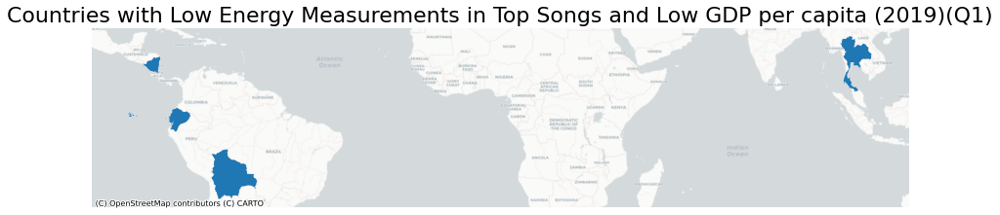

In [91]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['energy_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Energy Measurements in Top Songs and Low GDP per capita (2019)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

The code above maps out the countries that have low energy measurements in top songs and have low GDP per capita

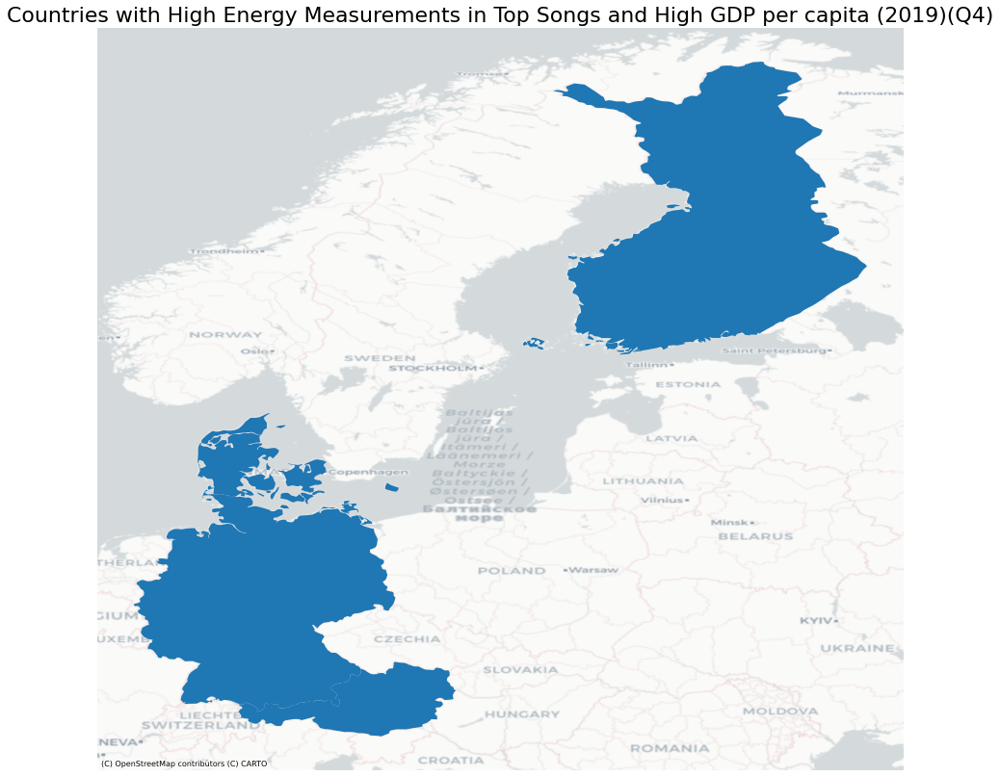

In [125]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['energy_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Energy Measurements in Top Songs and High GDP per capita (2019)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

The code above maps out the countries that have high energy measurements in top songs and have highGDP per capita

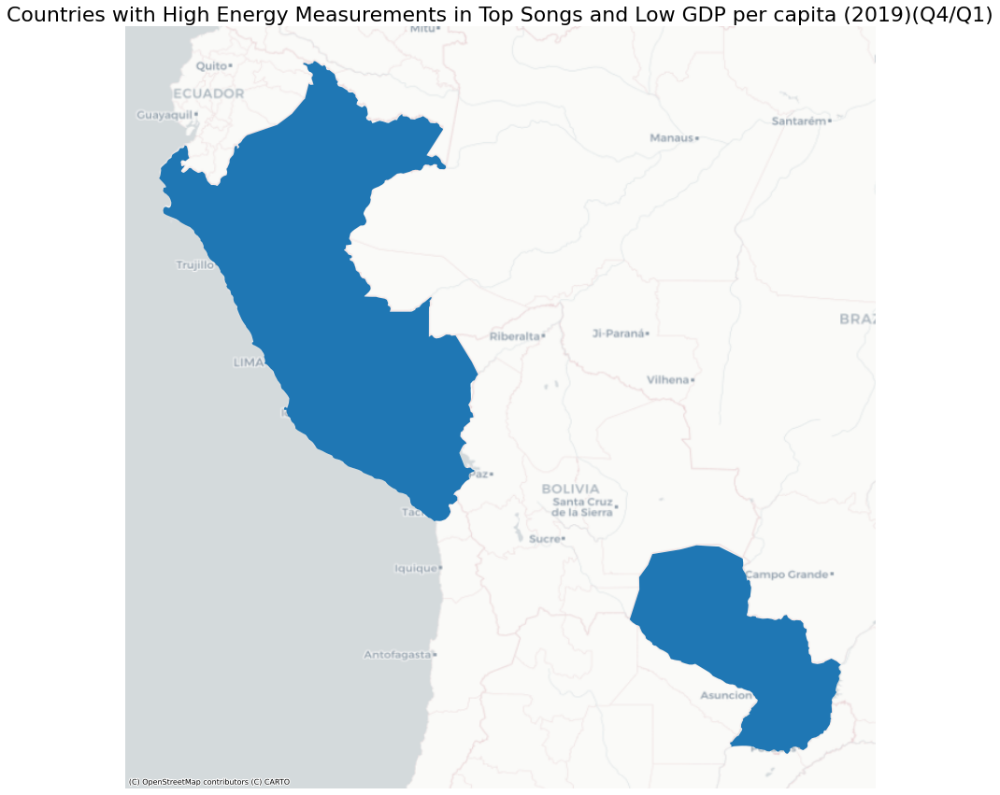

In [96]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['energy_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Energy Measurements in Top Songs and Low GDP per capita (2019)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

The code above maps out the countries that have high energy measurements in top songs and have low GDP per capita

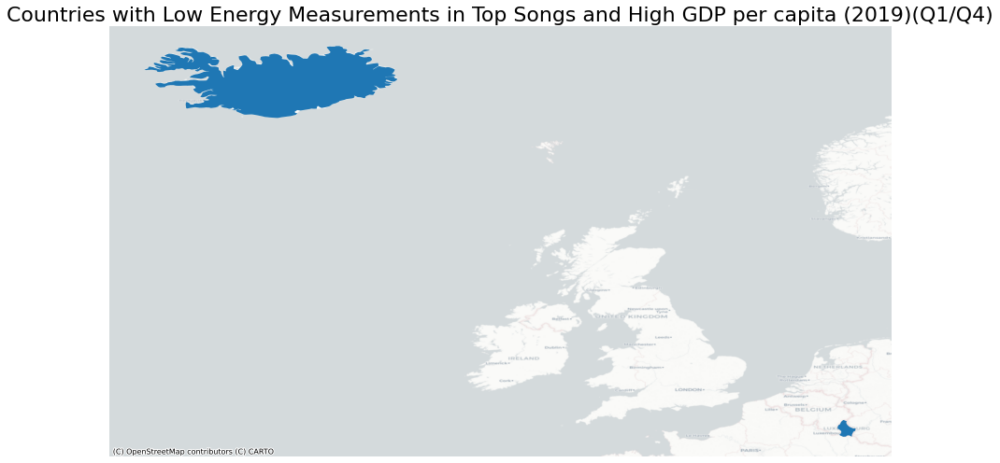

In [97]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['energy_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Energy Measurements in Top Songs and High GDP per capita (2019)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

The code above maps out the countries that have low energy measurements in top songs and have high GDP per capita

The above code was repeated for each of the song characteristics for both 2019 and 2020 Spotify data

### danceability

In [30]:
jdf['danceability_quartile'] = pd.qcut(jdf['danceability'],4,labels=['Q1','Q2','Q3','Q4'])

In [31]:
jdf[(jdf['danceability_quartile']=='Q1')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,COUNTRYAFF,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,danceability_quartile,energy_quartile
4,Bolivia,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,...,Bolivia,BO,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5...",218,BOL,3566.42,3321.92,Q1,Q1,Q1
8,Chile,37530.278448,0.647819,0.577411,4.798276,-7.054057,0.523276,0.120716,0.223144,0.058625,...,Chile,CL,"MULTIPOLYGON (((-73.04210 -43.73384, -73.04640...",228,CHL,14772.11,12612.32,Q2,Q1,Q1
14,Ecuador,5885.166773,0.668504,0.575990,4.235144,-7.148001,0.612141,0.105172,0.253426,0.069370,...,Ecuador,EC,"MULTIPOLYGON (((-79.45167 -4.76639, -79.51528 ...",248,ECU,6221.67,5315.52,Q1,Q1,Q1
21,Guatemala,3837.830518,0.666297,0.588847,4.309260,-6.915934,0.584741,0.105199,0.233922,0.075254,...,Guatemala,GT,"POLYGON ((-89.34831 14.43198, -89.43556 14.414...",258,GTM,4354.34,4239.67,Q1,Q1,Q2
25,India,11279.820103,0.665205,0.593446,5.604124,-6.983655,0.617526,0.127366,0.237781,0.056280,...,India,IN,"MULTIPOLYGON (((68.19780 23.76668, 68.20846 23...",534,IND,2097.78,1876.53,Q1,Q1,Q2
26,Indonesia,37444.121762,0.659184,0.596034,5.110869,-6.807192,0.638828,0.121683,0.254929,0.048830,...,Indonesia,ID,"MULTIPOLYGON (((109.64856 2.07341, 109.63081 2...",536,IDN,4196.67,4038.40,Q1,Q1,Q3
30,Japan,13553.253462,0.654515,0.627611,5.166177,-6.970464,0.554343,0.125982,0.233994,0.090571,...,Japan,JP,"MULTIPOLYGON (((134.29938 34.70412, 134.25027 ...",158,JPN,40255.94,39047.86,Q3,Q1,Q4
34,Malaysia,11831.246751,0.656871,0.592259,5.268553,-6.552916,0.675472,0.103464,0.274782,0.062374,...,Malaysia,MY,"MULTIPOLYGON (((114.09508 4.59054, 114.15332 4...",548,MYS,11193.02,10192.46,Q2,Q1,Q2
35,Mexico,110380.077198,0.657306,0.585571,4.069335,-6.746152,0.554682,0.094472,0.235818,0.084459,...,Mexico,MX,"MULTIPOLYGON (((-111.56001 24.42945, -111.5761...",273,MEX,9862.44,8069.10,Q2,Q1,Q1
36,Netherlands,58064.537423,0.665484,0.603879,5.770473,-6.553933,0.574112,0.142978,0.256661,0.067862,...,Netherlands,NL,"MULTIPOLYGON (((3.76416 51.34527, 3.86458 51.3...",138,NLD,52646.19,51289.57,Q4,Q1,Q3


In [32]:
jdf[(jdf['gdp_quartile']=='Q1')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,COUNTRYAFF,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,danceability_quartile,energy_quartile
4,Bolivia,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,...,Bolivia,BO,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5...",218,BOL,3566.42,3321.92,Q1,Q1,Q1
9,Colombia,12200.674832,0.688189,0.588009,4.707900,-6.630259,0.554807,0.110839,0.240584,0.044194,...,Colombia,CO,"MULTIPOLYGON (((-74.86081 11.12549, -74.83459 ...",233,COL,6423.18,5207.24,Q1,Q3,Q2
13,Dominican Republic,2482.402230,0.720239,0.595969,4.359108,-6.143255,0.510037,0.121369,0.202000,0.038151,...,Dominican Republic,DO,"MULTIPOLYGON (((-69.96722 18.42306, -70.00195 ...",243,DOM,8595.61,7444.80,Q1,Q4,Q3
14,Ecuador,5885.166773,0.668504,0.575990,4.235144,-7.148001,0.612141,0.105172,0.253426,0.069370,...,Ecuador,EC,"MULTIPOLYGON (((-79.45167 -4.76639, -79.51528 ...",248,ECU,6221.67,5315.52,Q1,Q1,Q1
15,El Salvador,1846.294964,0.672805,0.592739,4.962136,-6.834834,0.541840,0.107367,0.222628,0.067584,...,El Salvador,SV,"POLYGON ((-87.69467 13.81901, -87.72501 13.733...",253,SLV,4186.96,3821.29,Q1,Q2,Q2
21,Guatemala,3837.830518,0.666297,0.588847,4.309260,-6.915934,0.584741,0.105199,0.233922,0.075254,...,Guatemala,GT,"POLYGON ((-89.34831 14.43198, -89.43556 14.414...",258,GTM,4354.34,4239.67,Q1,Q1,Q2
22,Honduras,1720.069350,0.673264,0.588985,4.946749,-6.633913,0.558514,0.100948,0.229428,0.060166,...,Honduras,HN,"MULTIPOLYGON (((-86.76421 13.71069, -86.75084 ...",268,HND,2550.67,2412.44,Q1,Q2,Q2
25,India,11279.820103,0.665205,0.593446,5.604124,-6.983655,0.617526,0.127366,0.237781,0.056280,...,India,IN,"MULTIPOLYGON (((68.19780 23.76668, 68.20846 23...",534,IND,2097.78,1876.53,Q1,Q1,Q2
26,Indonesia,37444.121762,0.659184,0.596034,5.110869,-6.807192,0.638828,0.121683,0.254929,0.048830,...,Indonesia,ID,"MULTIPOLYGON (((109.64856 2.07341, 109.63081 2...",536,IDN,4196.67,4038.40,Q1,Q1,Q3
38,Nicaragua,1700.787234,0.618106,0.555096,4.946809,-7.386670,0.340426,0.140547,0.192763,0.116857,...,Nicaragua,NI,"POLYGON ((-83.13185 14.99298, -83.19667 14.956...",278,NIC,1920.29,1832.50,Q1,Q1,Q1


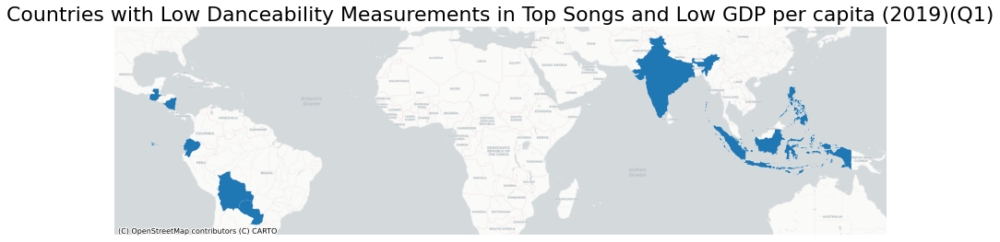

In [85]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['danceability_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Danceability Measurements in Top Songs and Low GDP per capita (2019)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

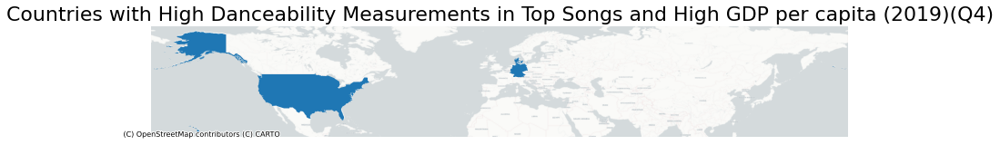

In [86]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['danceability_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Danceability Measurements in Top Songs and High GDP per capita (2019)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

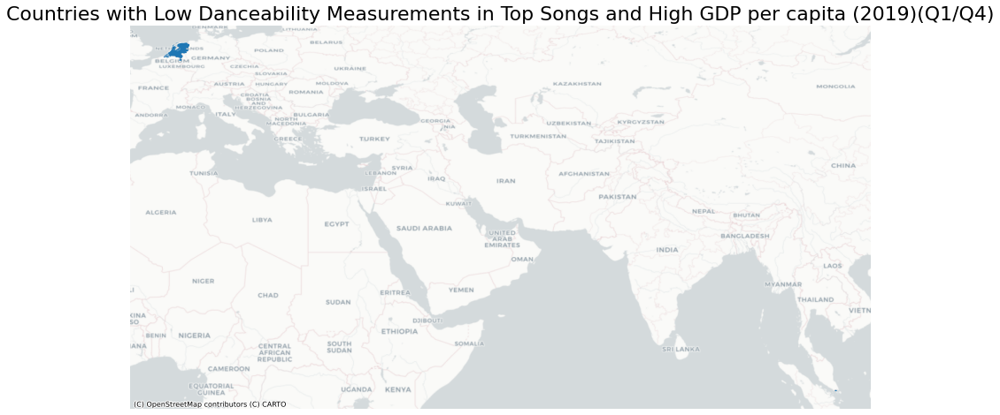

In [98]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['danceability_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Danceability Measurements in Top Songs and High GDP per capita (2019)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

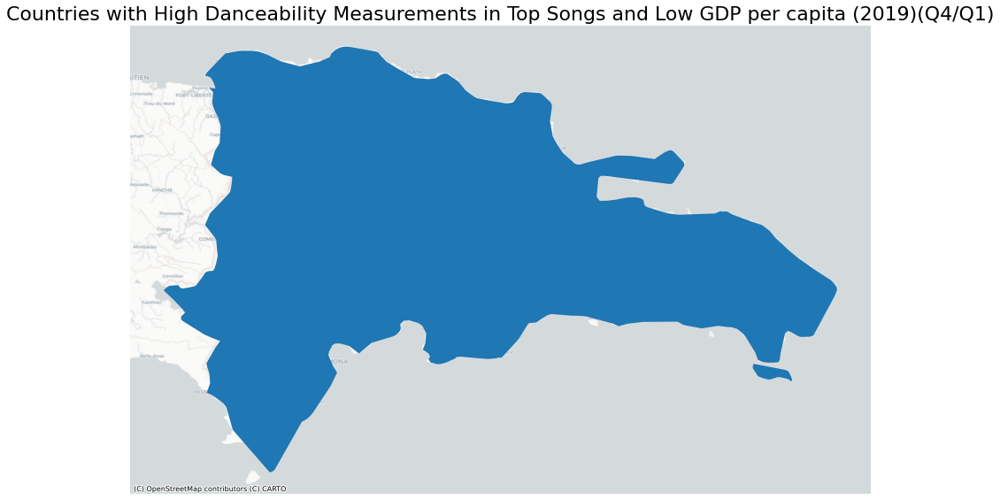

In [99]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['danceability_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Danceability Measurements in Top Songs and Low GDP per capita (2019)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### speechiness

In [34]:
jdf['speechiness_quartile'] = pd.qcut(jdf['speechiness'],4,labels=['Q1','Q2','Q3','Q4'])

In [35]:
jdf[(jdf['speechiness_quartile']=='Q1')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,danceability_quartile,energy_quartile,speechiness_quartile
0,Argentina,40676.207948,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,...,AR,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806...",213,ARG,9890.31,8433.04,Q2,Q2,Q1,Q1
4,Bolivia,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,...,BO,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5...",218,BOL,3566.42,3321.92,Q1,Q1,Q1,Q1
5,Brazil,105225.830370,0.699637,0.557919,4.628889,-6.627357,0.694815,0.096046,0.268008,0.063767,...,BR,"MULTIPOLYGON (((-44.69501 -1.81778, -44.64001 ...",223,BRA,8751.38,6450.45,Q2,Q3,Q1,Q1
9,Colombia,12200.674832,0.688189,0.588009,4.707900,-6.630259,0.554807,0.110839,0.240584,0.044194,...,CO,"MULTIPOLYGON (((-74.86081 11.12549, -74.83459 ...",233,COL,6423.18,5207.24,Q1,Q3,Q2,Q1
10,Costa Rica,4232.835196,0.670722,0.571789,4.862344,-6.723642,0.609709,0.100392,0.246624,0.063865,...,CR,"POLYGON ((-85.22679 9.72734, -85.27848 9.78597...",238,CRI,12243.84,11629.01,Q2,Q2,Q1,Q1
14,Ecuador,5885.166773,0.668504,0.575990,4.235144,-7.148001,0.612141,0.105172,0.253426,0.069370,...,EC,"MULTIPOLYGON (((-79.45167 -4.76639, -79.51528 ...",248,ECU,6221.67,5315.52,Q1,Q1,Q1,Q1
15,El Salvador,1846.294964,0.672805,0.592739,4.962136,-6.834834,0.541840,0.107367,0.222628,0.067584,...,SV,"POLYGON ((-87.69467 13.81901, -87.72501 13.733...",253,SLV,4186.96,3821.29,Q1,Q2,Q2,Q1
18,France,65085.823208,0.670040,0.613004,5.175427,-6.357327,0.556314,0.099465,0.270440,0.108725,...,FR,"MULTIPOLYGON (((1.78172 42.56996, 1.73861 42.6...",132,FRA,41896.58,39257.43,Q3,Q2,Q4,Q1
21,Guatemala,3837.830518,0.666297,0.588847,4.309260,-6.915934,0.584741,0.105199,0.233922,0.075254,...,GT,"POLYGON ((-89.34831 14.43198, -89.43556 14.414...",258,GTM,4354.34,4239.67,Q1,Q1,Q2,Q1
22,Honduras,1720.069350,0.673264,0.588985,4.946749,-6.633913,0.558514,0.100948,0.229428,0.060166,...,HN,"MULTIPOLYGON (((-86.76421 13.71069, -86.75084 ...",268,HND,2550.67,2412.44,Q1,Q2,Q2,Q1


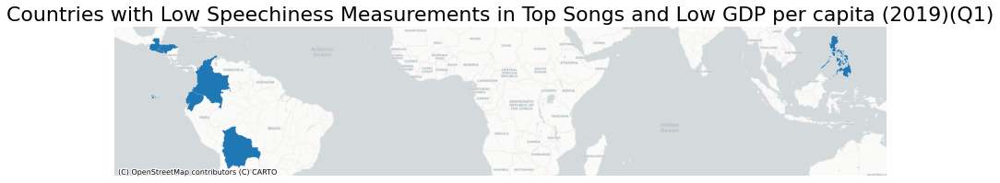

In [87]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['speechiness_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Speechiness Measurements in Top Songs and Low GDP per capita (2019)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

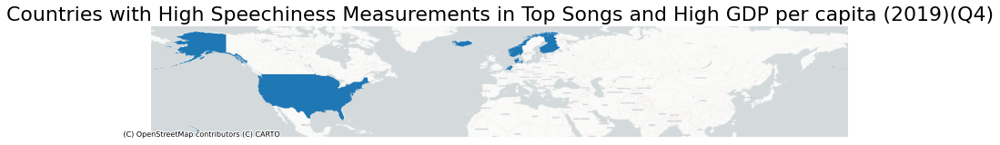

In [101]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['speechiness_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Speechiness Measurements in Top Songs and High GDP per capita (2019)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

/opt/conda/lib/python3.8/site-packages/geopandas/plotting.py:678: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


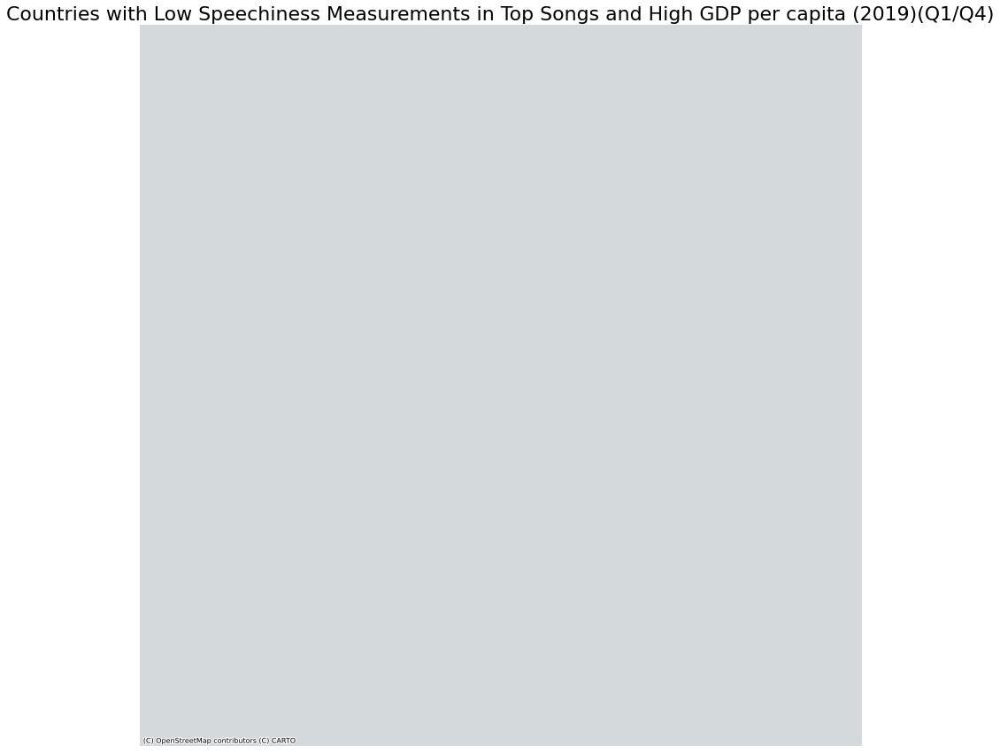

In [100]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['speechiness_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Speechiness Measurements in Top Songs and High GDP per capita (2019)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

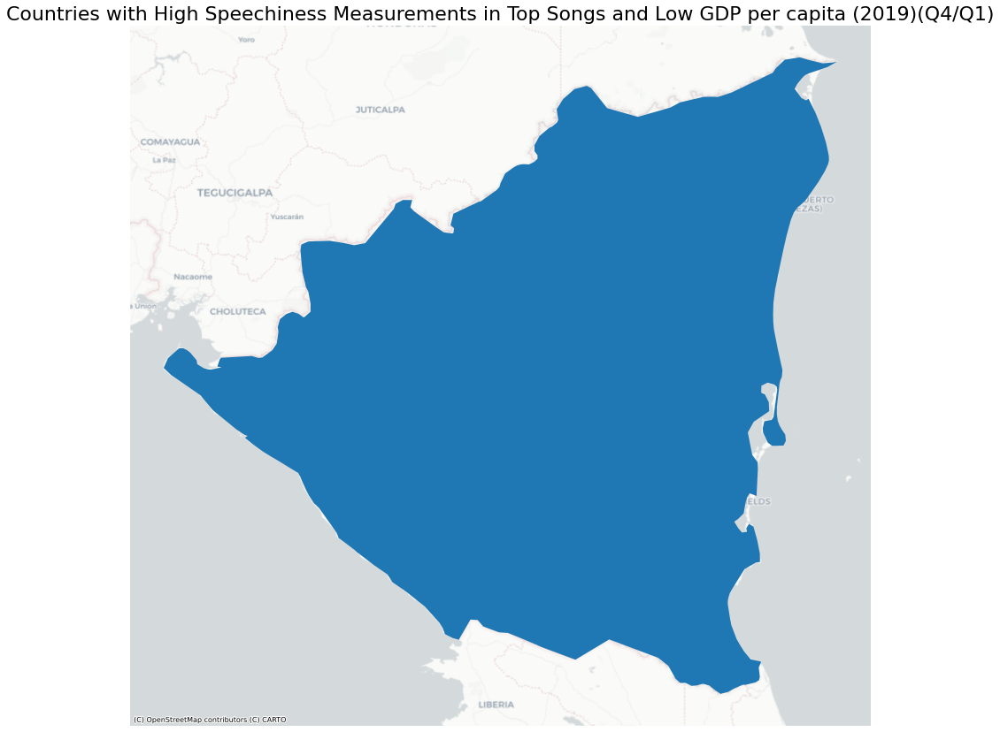

In [102]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['speechiness_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Speechiness Measurements in Top Songs and Low GDP per capita (2019)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### loudness

In [37]:
jdf['loudness_quartile'] = pd.qcut(jdf['loudness'],4,labels=['Q1','Q2','Q3','Q4'])

In [38]:
jdf[(jdf['loudness_quartile']=='Q1')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,danceability_quartile,energy_quartile,speechiness_quartile,loudness_quartile
0,Argentina,40676.207948,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,...,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806...",213,ARG,9890.31,8433.04,Q2,Q2,Q1,Q1,Q1
4,Bolivia,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,...,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5...",218,BOL,3566.42,3321.92,Q1,Q1,Q1,Q1,Q1
8,Chile,37530.278448,0.647819,0.577411,4.798276,-7.054057,0.523276,0.120716,0.223144,0.058625,...,"MULTIPOLYGON (((-73.04210 -43.73384, -73.04640...",228,CHL,14772.11,12612.32,Q2,Q1,Q1,Q2,Q1
14,Ecuador,5885.166773,0.668504,0.575990,4.235144,-7.148001,0.612141,0.105172,0.253426,0.069370,...,"MULTIPOLYGON (((-79.45167 -4.76639, -79.51528 ...",248,ECU,6221.67,5315.52,Q1,Q1,Q1,Q1,Q1
15,El Salvador,1846.294964,0.672805,0.592739,4.962136,-6.834834,0.541840,0.107367,0.222628,0.067584,...,"POLYGON ((-87.69467 13.81901, -87.72501 13.733...",253,SLV,4186.96,3821.29,Q1,Q2,Q2,Q1,Q1
21,Guatemala,3837.830518,0.666297,0.588847,4.309260,-6.915934,0.584741,0.105199,0.233922,0.075254,...,"POLYGON ((-89.34831 14.43198, -89.43556 14.414...",258,GTM,4354.34,4239.67,Q1,Q1,Q2,Q1,Q1
24,Iceland,1930.979236,0.696530,0.575845,4.801080,-6.870929,0.593023,0.145663,0.243751,0.042738,...,"POLYGON ((-22.02473 64.41888, -22.02445 64.443...",176,ISL,67857.18,57189.03,Q4,Q3,Q1,Q4,Q1
25,India,11279.820103,0.665205,0.593446,5.604124,-6.983655,0.617526,0.127366,0.237781,0.056280,...,"MULTIPOLYGON (((68.19780 23.76668, 68.20846 23...",534,IND,2097.78,1876.53,Q1,Q1,Q2,Q2,Q1
27,Ireland,11346.521974,0.670809,0.603742,5.297854,-6.910269,0.608994,0.137109,0.229310,0.070601,...,"MULTIPOLYGON (((-9.00147 53.14559, -9.03965 53...",178,IRL,80504.40,79668.50,Q4,Q2,Q3,Q3,Q1
30,Japan,13553.253462,0.654515,0.627611,5.166177,-6.970464,0.554343,0.125982,0.233994,0.090571,...,"MULTIPOLYGON (((134.29938 34.70412, 134.25027 ...",158,JPN,40255.94,39047.86,Q3,Q1,Q4,Q2,Q1


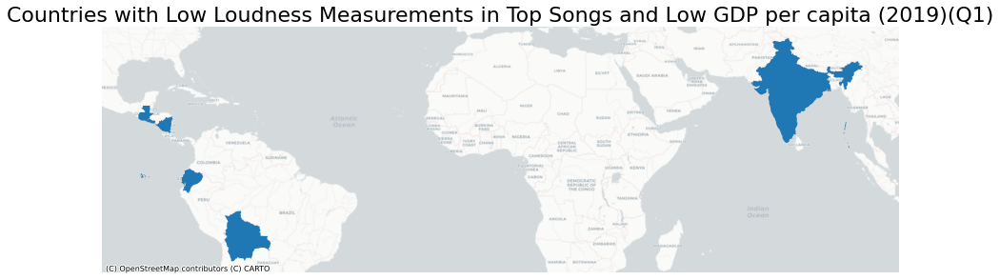

In [103]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['loudness_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Loudness Measurements in Top Songs and Low GDP per capita (2019)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

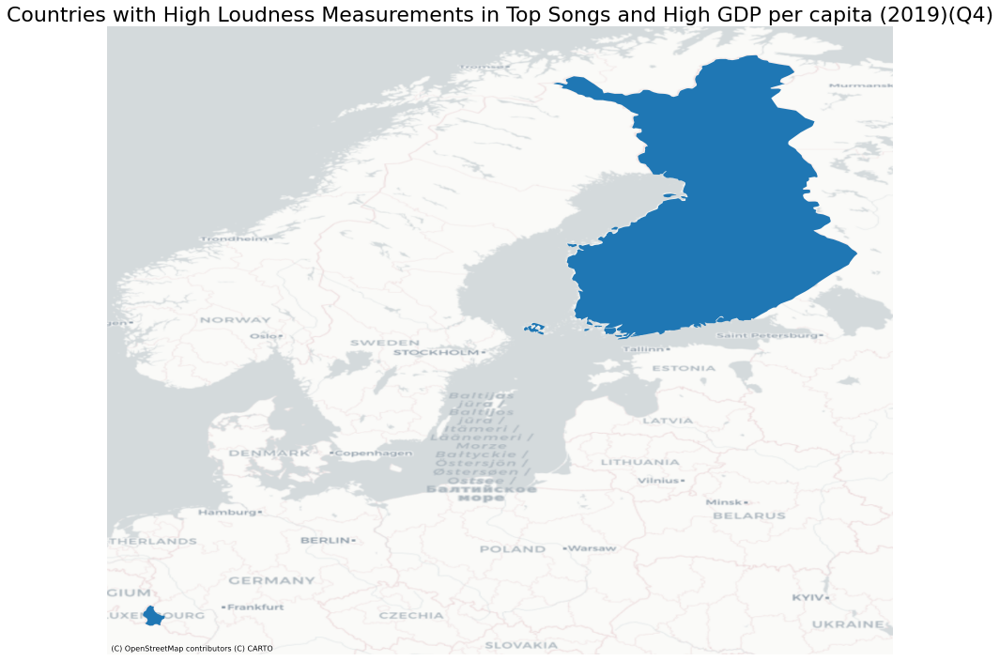

In [90]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['loudness_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Loudness Measurements in Top Songs and High GDP per capita (2019)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

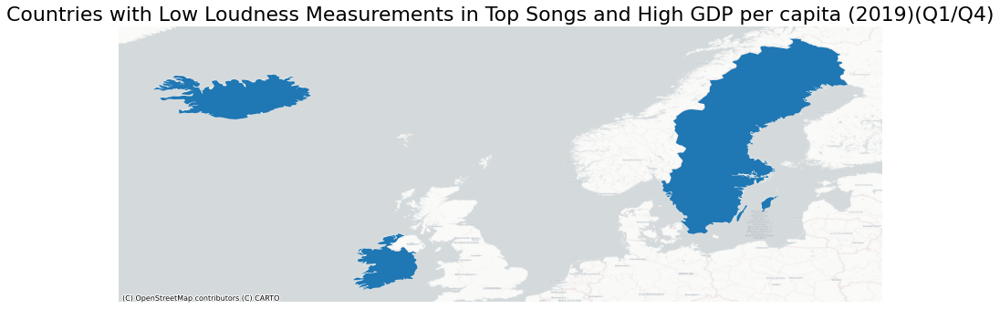

In [104]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['loudness_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Loudness Measurements in Top Songs and High GDP per capita (2019)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

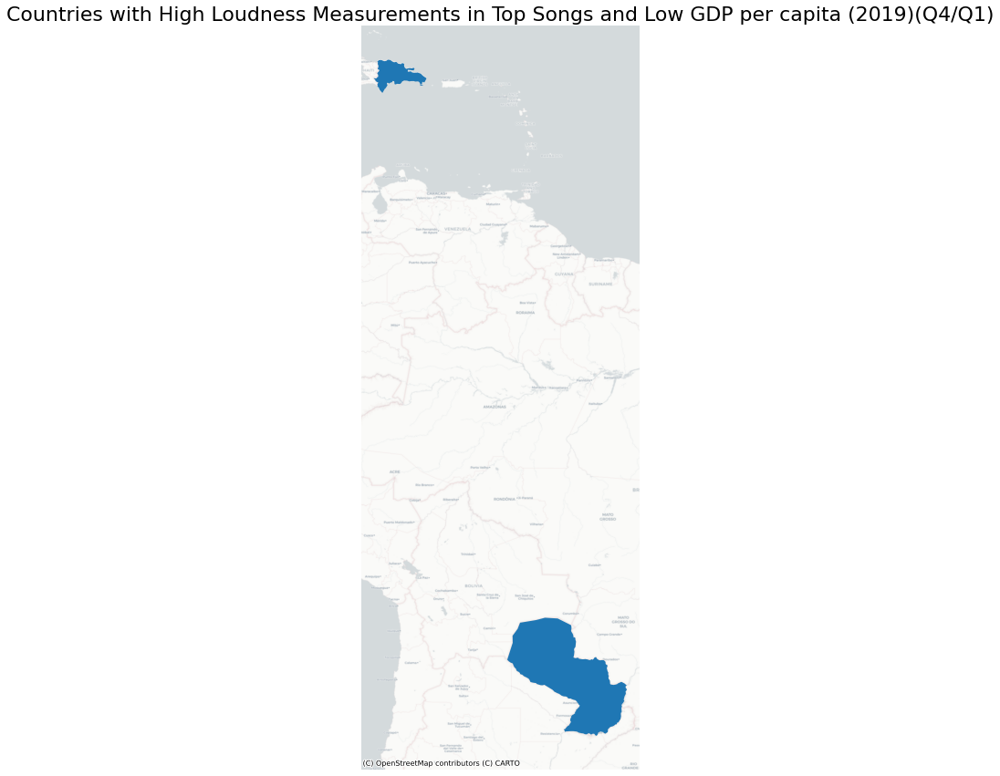

In [106]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['loudness_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Loudness Measurements in Top Songs and Low GDP per capita (2019)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### acousticness

In [40]:
jdf['acousticness_quartile'] = pd.qcut(jdf['acousticness'],4,labels=['Q1','Q2','Q3','Q4'])

In [41]:
jdf[(jdf['acousticness_quartile']=='Q1')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,danceability_quartile,energy_quartile,speechiness_quartile,loudness_quartile,acousticness_quartile
6,Bulgaria,1513.839109,0.742604,0.590042,5.259901,-6.212888,0.645215,0.129914,0.180040,0.027612,...,918,BGR,9772.15,9826.14,Q2,Q4,Q2,Q3,Q4,Q1
7,Canada,56293.913731,0.733903,0.606941,5.404133,-6.594242,0.610659,0.157274,0.196294,0.021752,...,156,CAN,46271.72,42080.05,Q3,Q4,Q4,Q4,Q3,Q1
13,Dominican Republic,2482.402230,0.720239,0.595969,4.359108,-6.143255,0.510037,0.121369,0.202000,0.038151,...,243,DOM,8595.61,7444.80,Q1,Q4,Q3,Q2,Q4,Q1
15,El Salvador,1846.294964,0.672805,0.592739,4.962136,-6.834834,0.541840,0.107367,0.222628,0.067584,...,253,SLV,4186.96,3821.29,Q1,Q2,Q2,Q1,Q1,Q1
20,Greece,3232.119222,0.733576,0.598029,5.118826,-6.504384,0.592541,0.151623,0.211415,0.039346,...,174,GRC,19569.53,18168.34,Q3,Q4,Q3,Q4,Q4,Q1
23,Hungary,3238.441556,0.693276,0.633995,5.188634,-6.197253,0.598146,0.134725,0.213277,0.054351,...,944,HUN,16469.61,15372.89,Q2,Q3,Q4,Q3,Q4,Q1
28,Israel,3286.734872,0.703466,0.620226,5.408759,-6.240195,0.574994,0.137785,0.214665,0.062090,...,436,ISR,43603.01,41559.51,Q3,Q4,Q4,Q3,Q4,Q1
31,Latvia,1540.650084,0.700605,0.587733,5.409359,-6.613669,0.578836,0.155651,0.222596,0.048669,...,941,LVA,17771.63,17230.14,Q2,Q4,Q1,Q4,Q3,Q1
33,Luxembourg,1597.333333,0.702750,0.558500,5.250000,-6.464944,0.444444,0.126439,0.219884,0.040861,...,137,LUX,115838.77,109602.32,Q4,Q4,Q1,Q2,Q4,Q1
38,Nicaragua,1700.787234,0.618106,0.555096,4.946809,-7.386670,0.340426,0.140547,0.192763,0.116857,...,278,NIC,1920.29,1832.50,Q1,Q1,Q1,Q4,Q1,Q1


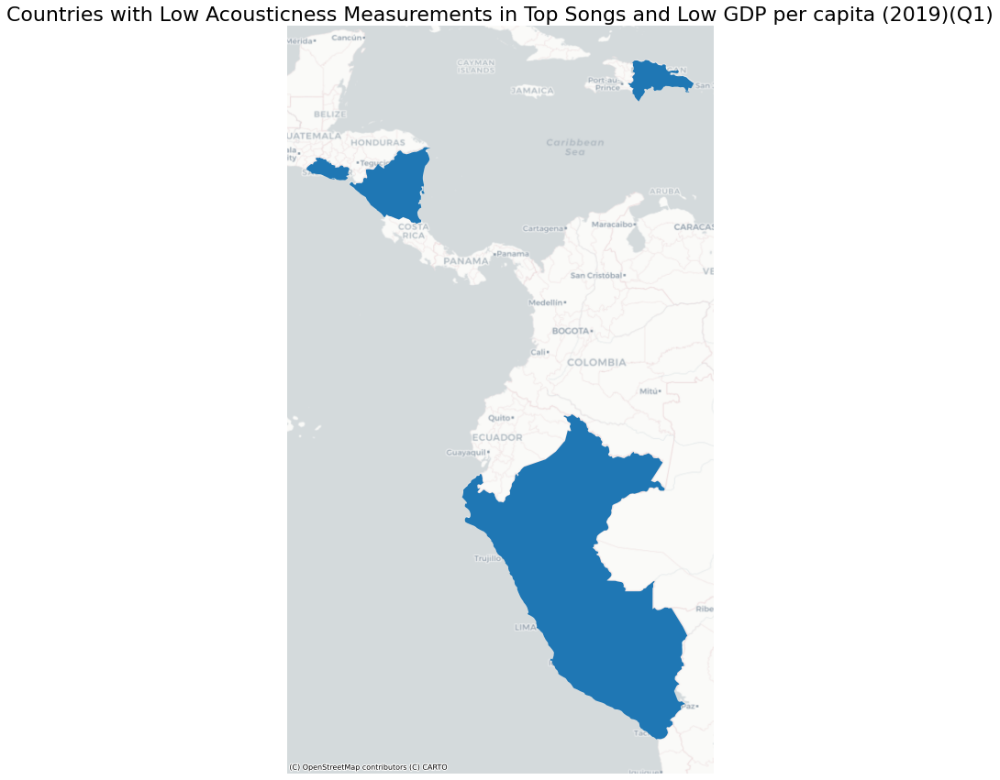

In [109]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['acousticness_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Acousticness Measurements in Top Songs and Low GDP per capita (2019)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

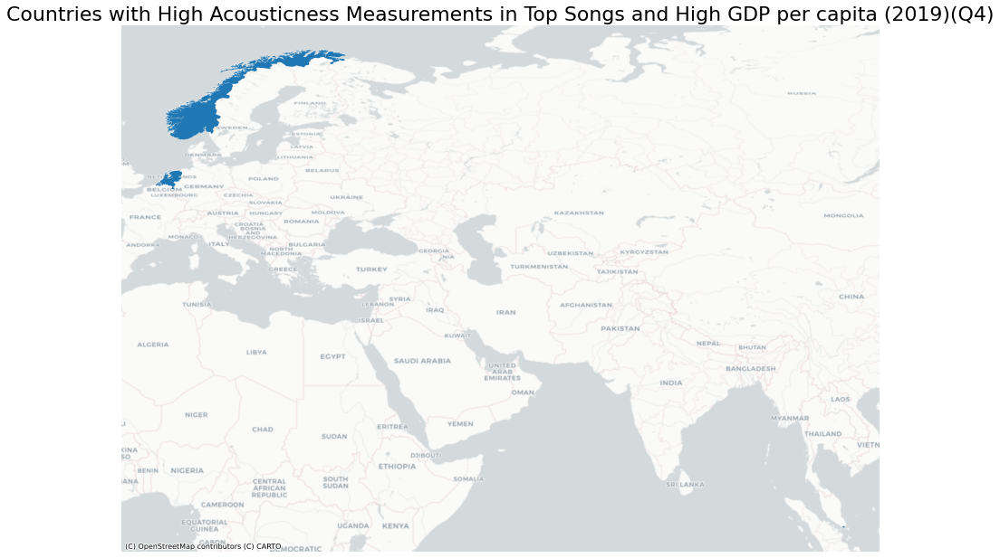

In [110]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['acousticness_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Acousticness Measurements in Top Songs and High GDP per capita (2019)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

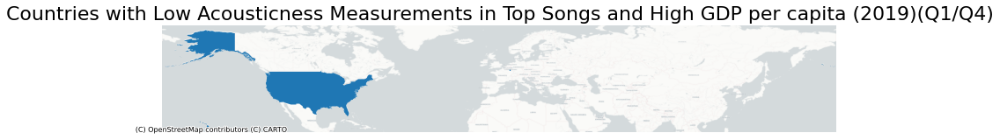

In [111]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['acousticness_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Acousticness Measurements in Top Songs and High GDP per capita (2019)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

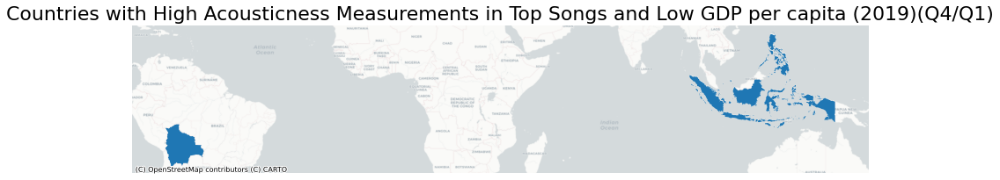

In [112]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['acousticness_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Acousticness Measurements in Top Songs and Low GDP per capita (2019)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### instrumentalness

In [43]:
jdf['instrumentalness_quartile'] = pd.qcut(jdf['instrumentalness'],4,labels=['Q1','Q2','Q3','Q4'])

In [44]:
jdf[(jdf['instrumentalness_quartile']=='Q1')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,ISO_y,GDP2019,GDP2020,gdp_quartile,danceability_quartile,energy_quartile,speechiness_quartile,loudness_quartile,acousticness_quartile,instrumentalness_quartile
1,Australia,51633.417764,0.698594,0.600252,4.931246,-6.718895,0.620831,0.132742,0.239568,0.040624,...,AUS,54348.23,51885.47,Q4,Q3,Q3,Q3,Q2,Q3,Q1
6,Bulgaria,1513.839109,0.742604,0.590042,5.259901,-6.212888,0.645215,0.129914,0.180040,0.027612,...,BGR,9772.15,9826.14,Q2,Q4,Q2,Q3,Q4,Q1,Q1
7,Canada,56293.913731,0.733903,0.606941,5.404133,-6.594242,0.610659,0.157274,0.196294,0.021752,...,CAN,46271.72,42080.05,Q3,Q4,Q4,Q4,Q3,Q1,Q1
13,Dominican Republic,2482.402230,0.720239,0.595969,4.359108,-6.143255,0.510037,0.121369,0.202000,0.038151,...,DOM,8595.61,7444.80,Q1,Q4,Q3,Q2,Q4,Q1,Q1
20,Greece,3232.119222,0.733576,0.598029,5.118826,-6.504384,0.592541,0.151623,0.211415,0.039346,...,GRC,19569.53,18168.34,Q3,Q4,Q3,Q4,Q4,Q1,Q1
24,Iceland,1930.979236,0.696530,0.575845,4.801080,-6.870929,0.593023,0.145663,0.243751,0.042738,...,ISL,67857.18,57189.03,Q4,Q3,Q1,Q4,Q1,Q3,Q1
33,Luxembourg,1597.333333,0.702750,0.558500,5.250000,-6.464944,0.444444,0.126439,0.219884,0.040861,...,LUX,115838.77,109602.32,Q4,Q4,Q1,Q2,Q4,Q1,Q1
37,New Zealand,10218.547197,0.702705,0.590014,4.932928,-6.883519,0.618283,0.137894,0.246355,0.041862,...,NZL,41666.64,38675.32,Q3,Q4,Q2,Q3,Q1,Q3,Q1
40,Panama,2594.704039,0.695383,0.588401,4.302592,-6.438266,0.605787,0.114449,0.220510,0.041136,...,PAN,15834.04,14090.50,Q2,Q3,Q2,Q2,Q4,Q1,Q1
42,Peru,22698.738134,0.681206,0.607700,4.372340,-6.529538,0.547463,0.111394,0.219116,0.034139,...,PER,6957.86,5844.69,Q1,Q2,Q4,Q2,Q3,Q1,Q1


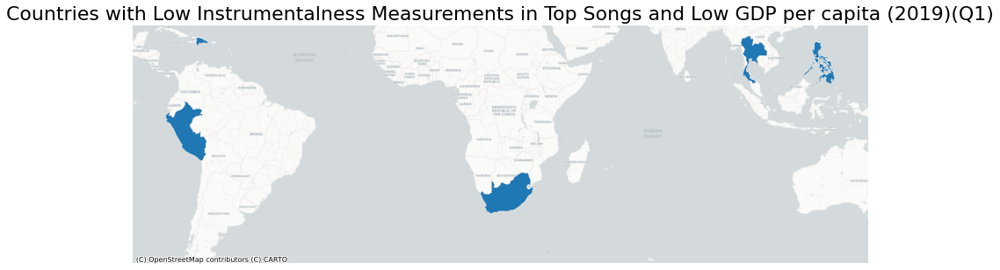

In [113]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['instrumentalness_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Instrumentalness Measurements in Top Songs and Low GDP per capita (2019)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

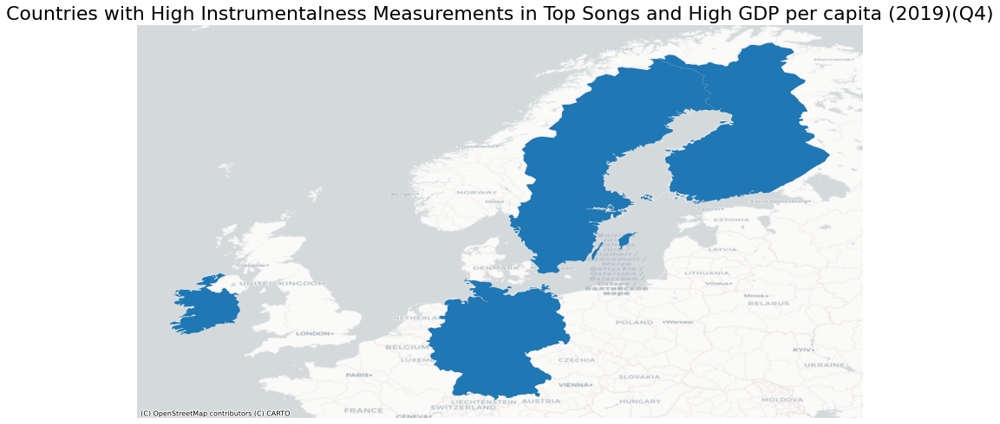

In [114]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['instrumentalness_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Instrumentalness Measurements in Top Songs and High GDP per capita (2019)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

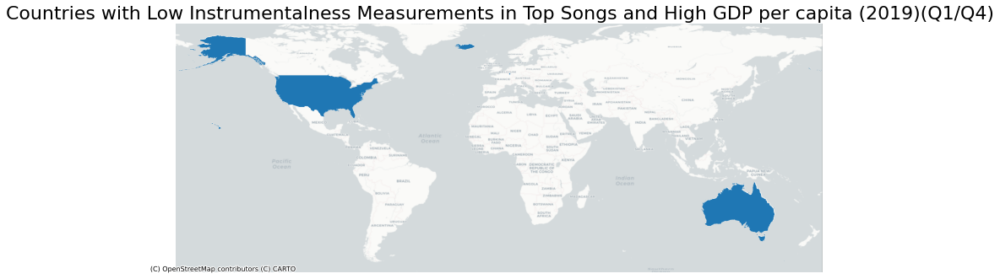

In [115]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['instrumentalness_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Instrumentalness Measurements in Top Songs and High GDP per capita (2019)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

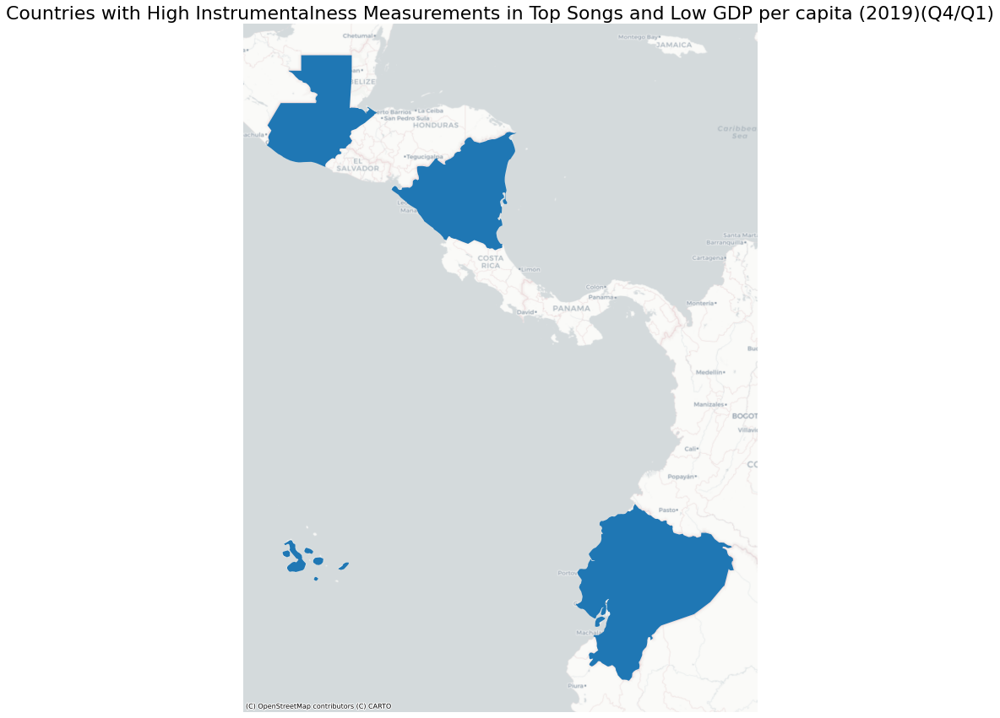

In [116]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['instrumentalness_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Instrumentalness Measurements in Top Songs and Low GDP per capita (2019)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### valence

In [46]:
jdf['valence_quartile'] = pd.qcut(jdf['valence'],4,labels=['Q1','Q2','Q3','Q4'])

In [47]:
jdf[(jdf['valence_quartile']=='Q1')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,GDP2019,GDP2020,gdp_quartile,danceability_quartile,energy_quartile,speechiness_quartile,loudness_quartile,acousticness_quartile,instrumentalness_quartile,valence_quartile
0,Argentina,40676.207948,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,...,9890.31,8433.04,Q2,Q2,Q1,Q1,Q1,Q4,Q3,Q1
3,Belgium,11039.809108,0.691866,0.590516,5.348896,-6.598304,0.577967,0.131102,0.260051,0.056351,...,46236.67,43813.77,Q3,Q3,Q2,Q3,Q3,Q4,Q2,Q1
10,Costa Rica,4232.835196,0.670722,0.571789,4.862344,-6.723642,0.609709,0.100392,0.246624,0.063865,...,12243.84,11629.01,Q2,Q2,Q1,Q1,Q2,Q3,Q3,Q1
16,Estonia,1655.595772,0.681758,0.585971,5.591928,-6.537441,0.546445,0.129028,0.248556,0.051819,...,23757.62,22985.86,Q3,Q2,Q1,Q3,Q3,Q3,Q2,Q1
20,Greece,3232.119222,0.733576,0.598029,5.118826,-6.504384,0.592541,0.151623,0.211415,0.039346,...,19569.53,18168.34,Q3,Q4,Q3,Q4,Q4,Q1,Q1,Q1
24,Iceland,1930.979236,0.696530,0.575845,4.801080,-6.870929,0.593023,0.145663,0.243751,0.042738,...,67857.18,57189.03,Q4,Q3,Q1,Q4,Q1,Q3,Q1,Q1
27,Ireland,11346.521974,0.670809,0.603742,5.297854,-6.910269,0.608994,0.137109,0.229310,0.070601,...,80504.40,79668.50,Q4,Q2,Q3,Q3,Q1,Q2,Q4,Q1
31,Latvia,1540.650084,0.700605,0.587733,5.409359,-6.613669,0.578836,0.155651,0.222596,0.048669,...,17771.63,17230.14,Q2,Q4,Q1,Q4,Q3,Q1,Q2,Q1
32,Lithuania,1762.547945,0.683611,0.596814,5.679909,-6.694166,0.570776,0.159625,0.223419,0.064549,...,19482.14,19883.07,Q3,Q3,Q3,Q4,Q2,Q2,Q3,Q1
33,Luxembourg,1597.333333,0.702750,0.558500,5.250000,-6.464944,0.444444,0.126439,0.219884,0.040861,...,115838.77,109602.32,Q4,Q4,Q1,Q2,Q4,Q1,Q1,Q1


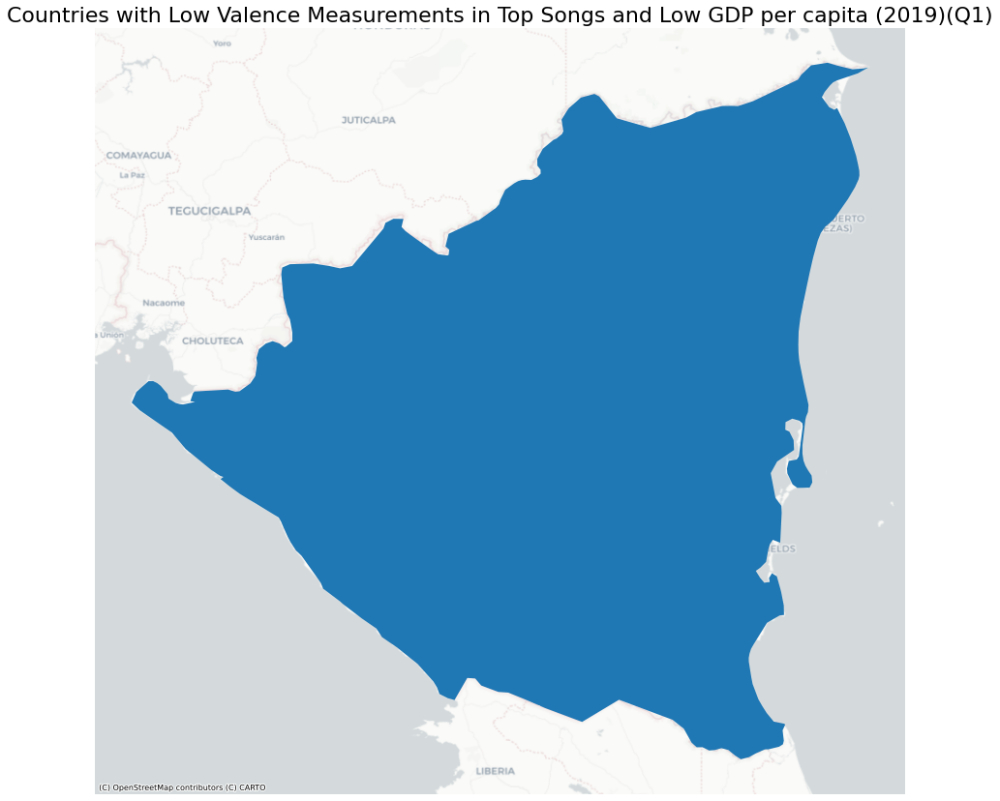

In [117]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['valence_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Valence Measurements in Top Songs and Low GDP per capita (2019)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

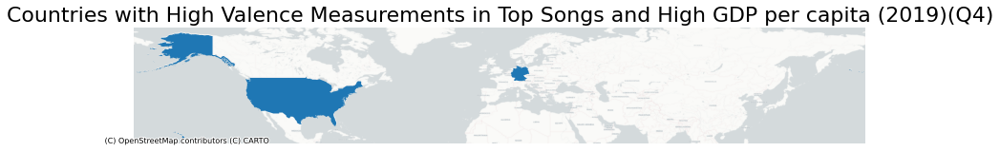

In [118]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['valence_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Valence Measurements in Top Songs and High GDP per capita (2019)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

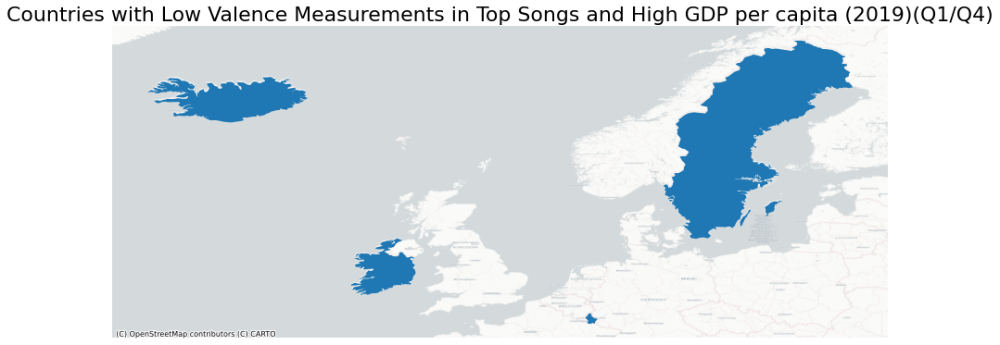

In [119]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['valence_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Valence Measurements in Top Songs and High GDP per capita (2019)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

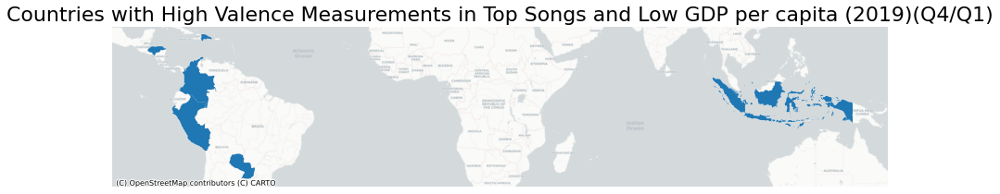

In [120]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['valence_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Valence Measurements in Top Songs and Low GDP per capita (2019)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### liveness

In [49]:
jdf['liveness_quartile'] = pd.qcut(jdf['liveness'],4,labels=['Q1','Q2','Q3','Q4'])

In [50]:
jdf[(jdf['liveness_quartile']=='Q1')]

,Country,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,GDP2020,gdp_quartile,danceability_quartile,energy_quartile,speechiness_quartile,loudness_quartile,acousticness_quartile,instrumentalness_quartile,valence_quartile,liveness_quartile
4,Bolivia,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,...,3321.92,Q1,Q1,Q1,Q1,Q1,Q4,Q3,Q3,Q1
5,Brazil,105225.830370,0.699637,0.557919,4.628889,-6.627357,0.694815,0.096046,0.268008,0.063767,...,6450.45,Q2,Q3,Q1,Q1,Q3,Q4,Q3,Q4,Q1
9,Colombia,12200.674832,0.688189,0.588009,4.707900,-6.630259,0.554807,0.110839,0.240584,0.044194,...,5207.24,Q1,Q3,Q2,Q1,Q3,Q3,Q2,Q4,Q1
10,Costa Rica,4232.835196,0.670722,0.571789,4.862344,-6.723642,0.609709,0.100392,0.246624,0.063865,...,11629.01,Q2,Q2,Q1,Q1,Q2,Q3,Q3,Q1,Q1
13,Dominican Republic,2482.402230,0.720239,0.595969,4.359108,-6.143255,0.510037,0.121369,0.202000,0.038151,...,7444.80,Q1,Q4,Q3,Q2,Q4,Q1,Q1,Q4,Q1
14,Ecuador,5885.166773,0.668504,0.575990,4.235144,-7.148001,0.612141,0.105172,0.253426,0.069370,...,5315.52,Q1,Q1,Q1,Q1,Q1,Q3,Q4,Q3,Q1
18,France,65085.823208,0.670040,0.613004,5.175427,-6.357327,0.556314,0.099465,0.270440,0.108725,...,39257.43,Q3,Q2,Q4,Q1,Q4,Q4,Q4,Q3,Q1
21,Guatemala,3837.830518,0.666297,0.588847,4.309260,-6.915934,0.584741,0.105199,0.233922,0.075254,...,4239.67,Q1,Q1,Q2,Q1,Q1,Q2,Q4,Q3,Q1
29,Italy,93259.907960,0.684056,0.584638,4.872305,-6.589245,0.663350,0.112269,0.282958,0.089037,...,30657.30,Q3,Q3,Q1,Q2,Q3,Q4,Q4,Q4,Q1
33,Luxembourg,1597.333333,0.702750,0.558500,5.250000,-6.464944,0.444444,0.126439,0.219884,0.040861,...,109602.32,Q4,Q4,Q1,Q2,Q4,Q1,Q1,Q1,Q1


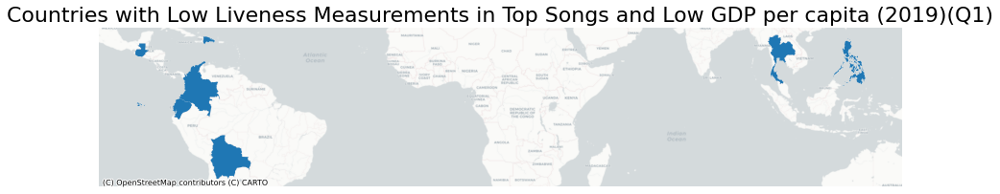

In [121]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['liveness_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Liveness Measurements in Top Songs and Low GDP per capita (2019)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

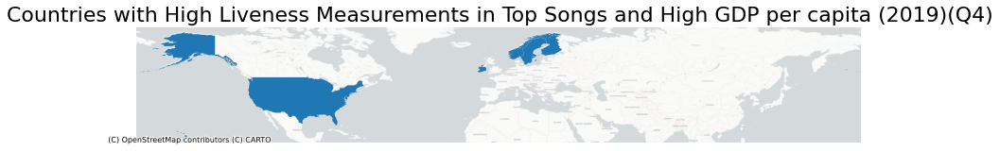

In [122]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['liveness_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Liveness Measurements in Top Songs and High GDP per capita (2019)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

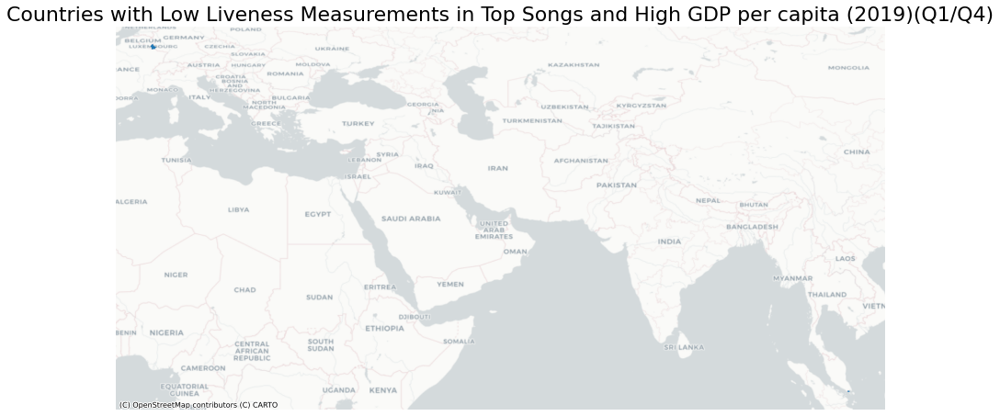

In [123]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['liveness_quartile']=='Q1') &
   (jdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Liveness Measurements in Top Songs and High GDP per capita (2019)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

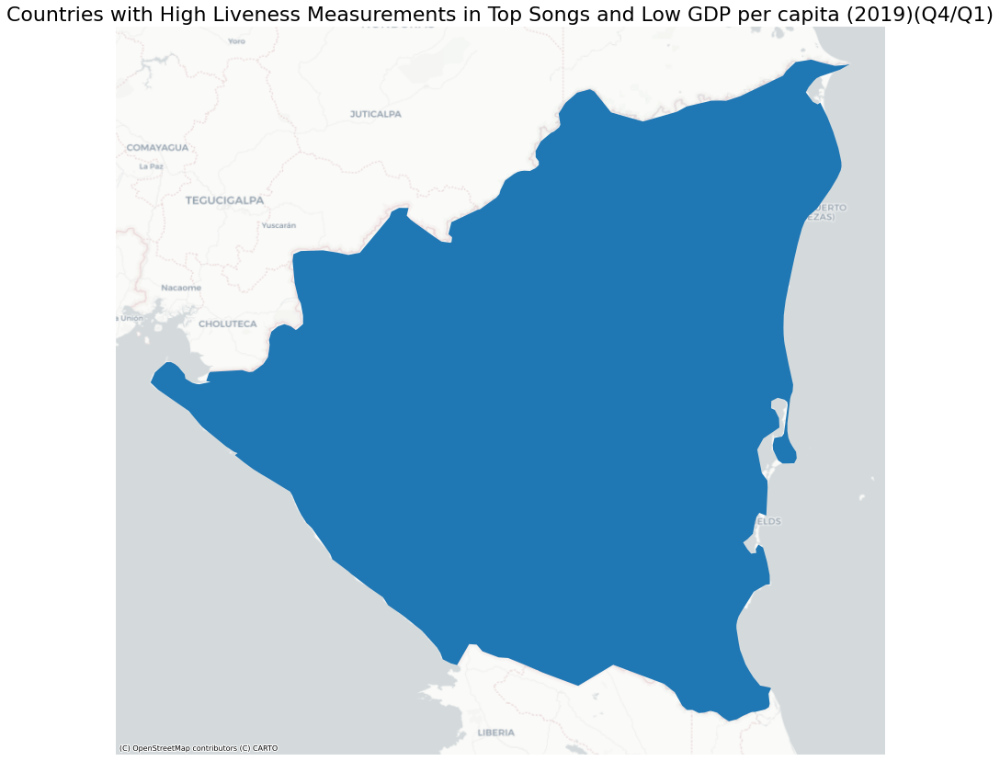

In [124]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
jdf[(jdf['liveness_quartile']=='Q4') &
   (jdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Liveness Measurements in Top Songs and Low GDP per capita (2019)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

## 2020 Quartile Measurements for Song Characteristics and GDP

In [52]:
mdf['gdp_quartile'] = pd.qcut(mdf['GDP2020'],4,labels=['Q1','Q2','Q3','Q4'])

In [53]:
type(mdf)

pandas.core.frame.DataFrame

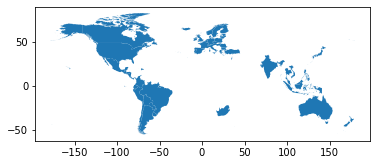

In [54]:
mdf = gpd.GeoDataFrame(mdf)
mdf.plot()

In [55]:
mdf.head()

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,FID,ISO_x,COUNTRYAFF,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile
0,Argentina,0.693941,0.659353,3.941176,-6.295824,0.647059,0.146606,0.172241,0.000712,0.141424,...,15,AR,Argentina,AR,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806...",213,ARG,9890.31,8433.04,Q2
1,Australia,0.692203,0.628671,5.341772,-6.683797,0.531646,0.108065,0.198552,0.044756,0.202782,...,218,AU,Australia,AU,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137...",193,AUS,54348.23,51885.47,Q4
2,Austria,0.727636,0.626455,6.600000,-6.766836,0.454545,0.127291,0.167883,0.030190,0.215382,...,165,AT,Austria,AT,"POLYGON ((10.47124 46.87135, 10.48821 46.93599...",122,AUT,50380.28,48634.34,Q4
3,Belgium,0.710246,0.593783,5.956522,-6.911913,0.478261,0.109658,0.224307,0.033749,0.198519,...,160,BE,Belgium,BE,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ...",124,BEL,46236.67,43813.77,Q4
4,Bolivia,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,...,20,BO,Bolivia,BO,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5...",218,BOL,3566.42,3321.92,Q1


### energy

In [56]:
mdf['energy_quartile'] = pd.qcut(mdf['energy'],4,labels=['Q1','Q2','Q3','Q4'])

In [57]:
mdf[(mdf['energy_quartile']=='Q1')]

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,ISO_x,COUNTRYAFF,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,energy_quartile
3,Belgium,0.710246,0.593783,5.956522,-6.911913,0.478261,0.109658,0.224307,0.033749,0.198519,...,BE,Belgium,BE,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ...",124,BEL,46236.67,43813.77,Q4,Q1
7,Canada,0.721515,0.612371,5.536082,-6.680742,0.567010,0.116015,0.205720,0.036540,0.188881,...,CA,Canada,CA,"MULTIPOLYGON (((-87.03528 65.47915, -87.06368 ...",156,CAN,46271.72,42080.05,Q3,Q1
16,Estonia,0.718708,0.616446,6.215385,-6.803831,0.415385,0.104105,0.178615,0.033731,0.212258,...,EE,Estonia,EE,"MULTIPOLYGON (((28.01583 59.47860, 28.02639 59...",939,EST,23757.62,22985.86,Q3,Q1
23,Hungary,0.716013,0.618623,6.142857,-6.580987,0.467532,0.117569,0.195037,0.039007,0.201608,...,HU,Hungary,HU,"POLYGON ((21.48941 46.68454, 21.45354 46.68464...",944,HUN,16469.61,15372.89,Q2,Q1
24,Iceland,0.724453,0.603679,6.113208,-6.607736,0.509434,0.111991,0.173987,0.031710,0.236802,...,IS,Iceland,IS,"POLYGON ((-22.02473 64.41888, -22.02445 64.443...",176,ISL,67857.18,57189.03,Q4,Q1
26,Indonesia,0.669114,0.592914,5.342857,-7.181286,0.514286,0.095860,0.265625,0.082265,0.165609,...,ID,Indonesia,ID,"MULTIPOLYGON (((109.64856 2.07341, 109.63081 2...",536,IDN,4196.67,4038.40,Q1,Q1
27,Ireland,0.698132,0.614395,5.921053,-6.928671,0.473684,0.116657,0.214004,0.051920,0.207497,...,IE,Ireland,IE,"MULTIPOLYGON (((-9.00147 53.14559, -9.03965 53...",178,IRL,80504.40,79668.50,Q4,Q1
33,Luxembourg,0.685800,0.607720,5.940000,-6.643740,0.460000,0.117764,0.244436,0.073173,0.198714,...,LU,Luxembourg,LU,"POLYGON ((6.35649 49.52586, 6.36278 49.48916, ...",137,LUX,115838.77,109602.32,Q4,Q1
34,Malaysia,0.648226,0.617581,5.193548,-6.502742,0.580645,0.078142,0.237496,0.049506,0.161577,...,MY,Malaysia,MY,"MULTIPOLYGON (((114.09508 4.59054, 114.15332 4...",548,MYS,11193.02,10192.46,Q2,Q1
44,Philippines,0.664400,0.613775,5.400000,-6.649350,0.525000,0.096340,0.255381,0.071554,0.160855,...,PH,Philippines,PH,"MULTIPOLYGON (((119.89258 15.80113, 119.91304 ...",566,PHL,3511.94,3372.53,Q1,Q1


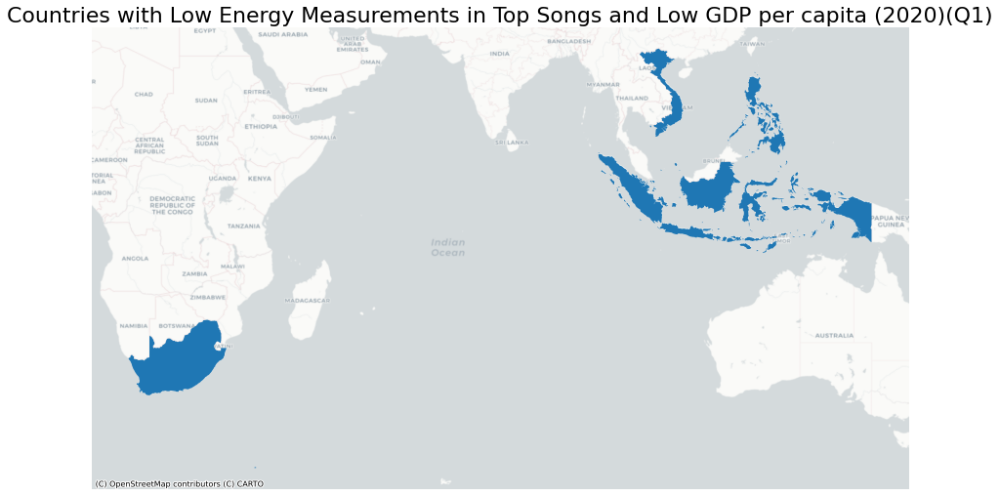

In [126]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['energy_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Energy Measurements in Top Songs and Low GDP per capita (2020)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

/opt/conda/lib/python3.8/site-packages/geopandas/plotting.py:678: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


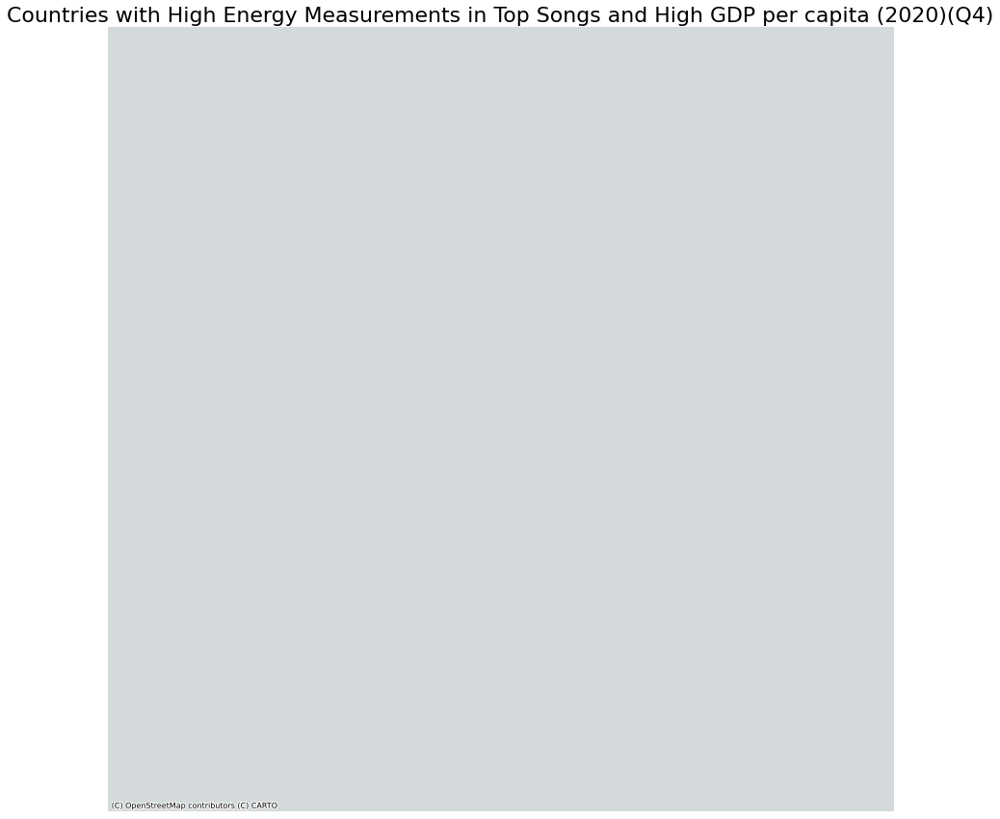

In [127]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['energy_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Energy Measurements in Top Songs and High GDP per capita (2020)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

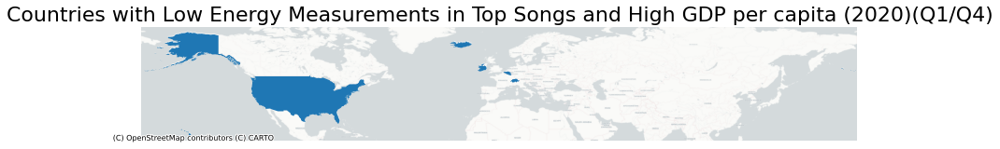

In [128]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['energy_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Energy Measurements in Top Songs and High GDP per capita (2020)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

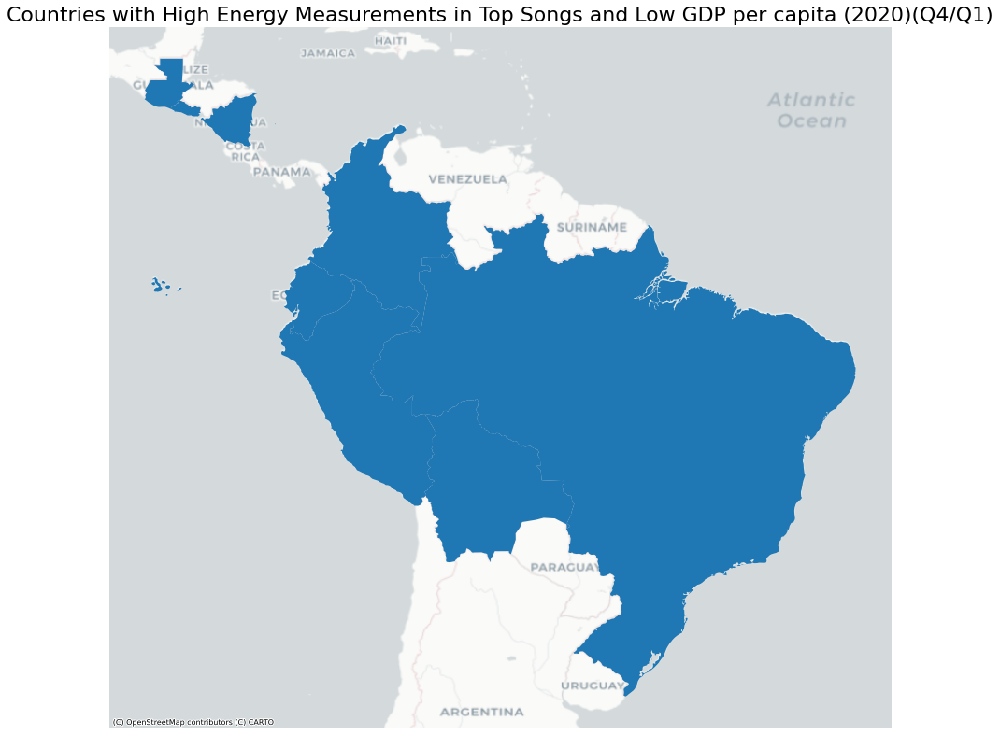

In [129]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['energy_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Energy Measurements in Top Songs and Low GDP per capita (2020)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### danceability

In [59]:
mdf['danceability_quartile'] = pd.qcut(mdf['danceability'],4,labels=['Q1','Q2','Q3','Q4'])

In [60]:
mdf[(mdf['danceability_quartile']=='Q1')]

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,COUNTRYAFF,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,energy_quartile,danceability_quartile
8,Chile,0.669727,0.729364,4.090909,-5.229182,0.636364,0.083518,0.223510,0.000065,0.117109,...,Chile,CL,"MULTIPOLYGON (((-73.04210 -43.73384, -73.04640...",228,CHL,14772.11,12612.32,Q2,Q4,Q1
13,Dominican Republic,0.652833,0.659250,2.500000,-6.227083,0.666667,0.099283,0.244176,0.078880,0.110900,...,Dominican Republic,DO,"MULTIPOLYGON (((-69.96722 18.42306, -70.00195 ...",243,DOM,8595.61,7444.80,Q2,Q3,Q1
15,El Salvador,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,El Salvador,SV,"POLYGON ((-87.69467 13.81901, -87.72501 13.733...",253,SLV,4186.96,3821.29,Q1,Q4,Q1
21,Guatemala,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,Guatemala,GT,"POLYGON ((-89.34831 14.43198, -89.43556 14.414...",258,GTM,4354.34,4239.67,Q1,Q4,Q1
26,Indonesia,0.669114,0.592914,5.342857,-7.181286,0.514286,0.095860,0.265625,0.082265,0.165609,...,Indonesia,ID,"MULTIPOLYGON (((109.64856 2.07341, 109.63081 2...",536,IDN,4196.67,4038.40,Q1,Q1,Q1
30,Japan,0.559818,0.736091,4.181818,-6.520636,0.636364,0.163727,0.104702,0.244818,0.121245,...,Japan,JP,"MULTIPOLYGON (((134.29938 34.70412, 134.25027 ...",158,JPN,40255.94,39047.86,Q3,Q4,Q1
34,Malaysia,0.648226,0.617581,5.193548,-6.502742,0.580645,0.078142,0.237496,0.049506,0.161577,...,Malaysia,MY,"MULTIPOLYGON (((114.09508 4.59054, 114.15332 4...",548,MYS,11193.02,10192.46,Q2,Q1,Q1
35,Malta,0.637947,0.656368,5.631579,-6.613105,0.368421,0.092368,0.181090,0.080117,0.159837,...,Malta,MT,"POLYGON ((14.51972 35.80000, 14.42389 35.81860...",181,MLT,30374.22,28468.65,Q3,Q3,Q1
39,Nicaragua,0.669727,0.729364,4.090909,-5.229182,0.636364,0.083518,0.223510,0.000065,0.117109,...,Nicaragua,NI,"POLYGON ((-83.13185 14.99298, -83.19667 14.956...",278,NIC,1920.29,1832.50,Q1,Q4,Q1
41,Panama,0.635800,0.678700,4.000000,-5.832700,0.800000,0.079030,0.202980,0.094653,0.122580,...,Panama,PA,"MULTIPOLYGON (((-80.02649 8.40154, -80.07055 8...",283,PAN,15834.04,14090.50,Q2,Q4,Q1


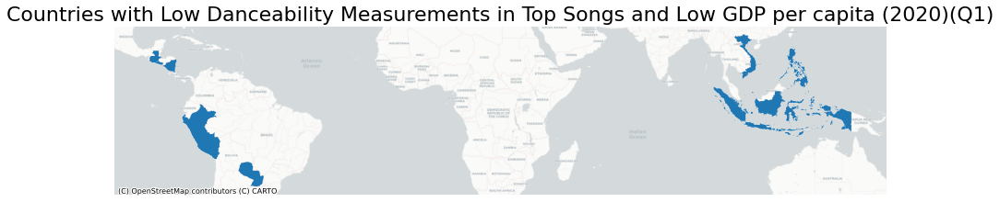

In [130]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['danceability_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Danceability Measurements in Top Songs and Low GDP per capita (2020)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

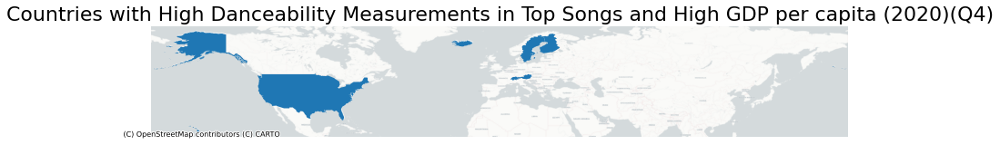

In [131]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['danceability_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Danceability Measurements in Top Songs and High GDP per capita (2020)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

/opt/conda/lib/python3.8/site-packages/geopandas/plotting.py:678: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


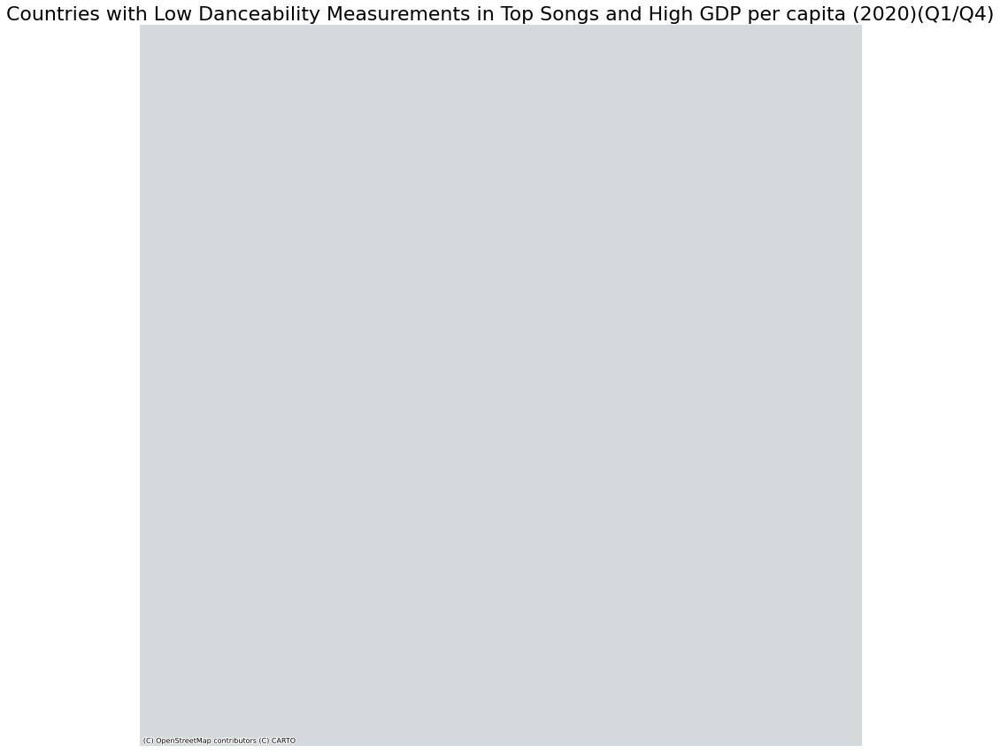

In [132]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['danceability_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Danceability Measurements in Top Songs and High GDP per capita (2020)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

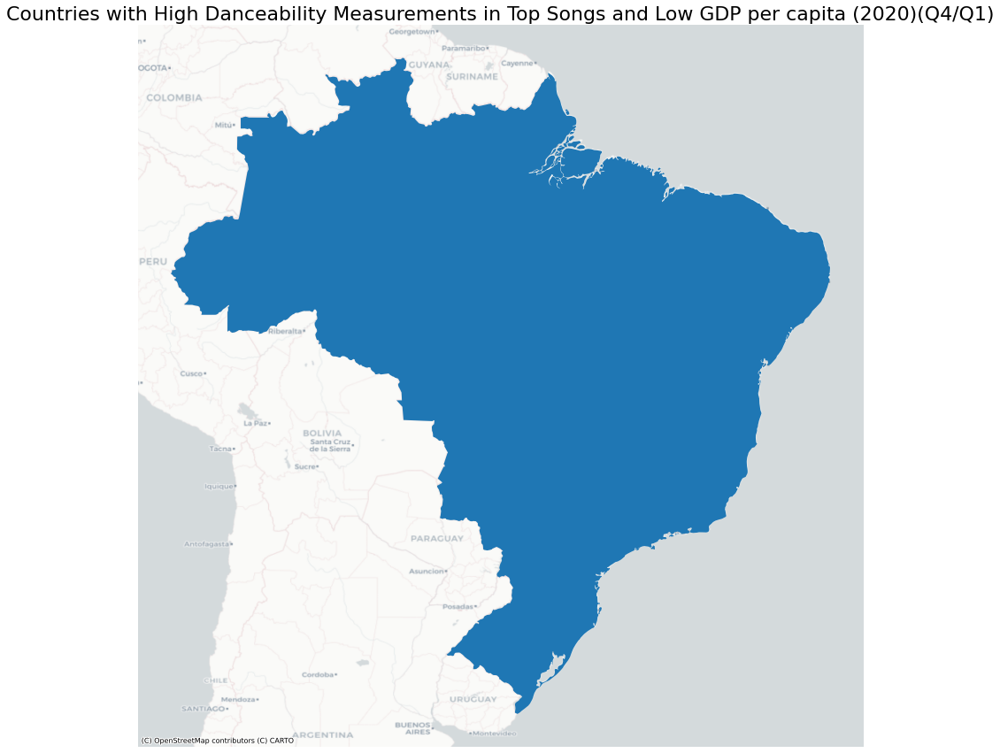

In [133]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['danceability_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Danceability Measurements in Top Songs and Low GDP per capita (2020)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### loudness

In [62]:
mdf['loudness_quartile'] = pd.qcut(mdf['loudness'],4,labels=['Q1','Q2','Q3','Q4'])

In [63]:
mdf[(mdf['loudness_quartile']=='Q1')]

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,AFF_ISO,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,energy_quartile,danceability_quartile,loudness_quartile
2,Austria,0.727636,0.626455,6.600000,-6.766836,0.454545,0.127291,0.167883,0.030190,0.215382,...,AT,"POLYGON ((10.47124 46.87135, 10.48821 46.93599...",122,AUT,50380.28,48634.34,Q4,Q2,Q4,Q1
3,Belgium,0.710246,0.593783,5.956522,-6.911913,0.478261,0.109658,0.224307,0.033749,0.198519,...,BE,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ...",124,BEL,46236.67,43813.77,Q4,Q1,Q3,Q1
6,Bulgaria,0.727946,0.625351,6.851351,-6.736257,0.378378,0.137872,0.154195,0.040260,0.229649,...,BG,"POLYGON ((22.93560 41.34213, 22.95590 41.35562...",918,BGR,9772.15,9826.14,Q2,Q2,Q4,Q1
16,Estonia,0.718708,0.616446,6.215385,-6.803831,0.415385,0.104105,0.178615,0.033731,0.212258,...,EE,"MULTIPOLYGON (((28.01583 59.47860, 28.02639 59...",939,EST,23757.62,22985.86,Q3,Q1,Q4,Q1
18,France,0.731432,0.636054,6.135135,-6.932541,0.405405,0.110289,0.180700,0.041666,0.216019,...,FR,"MULTIPOLYGON (((1.78172 42.56996, 1.73861 42.6...",132,FRA,41896.58,39257.43,Q3,Q3,Q4,Q1
20,Greece,0.711658,0.629434,6.039474,-6.785395,0.407895,0.128218,0.158030,0.044553,0.208349,...,GR,"MULTIPOLYGON (((21.08305 39.05666, 21.04527 39...",174,GRC,19569.53,18168.34,Q3,Q2,Q3,Q1
25,India,0.706250,0.620389,6.916667,-7.115167,0.416667,0.096178,0.199203,0.079967,0.244039,...,IN,"MULTIPOLYGON (((68.19780 23.76668, 68.20846 23...",534,IND,2097.78,1876.53,Q1,Q2,Q3,Q1
26,Indonesia,0.669114,0.592914,5.342857,-7.181286,0.514286,0.095860,0.265625,0.082265,0.165609,...,ID,"MULTIPOLYGON (((109.64856 2.07341, 109.63081 2...",536,IDN,4196.67,4038.40,Q1,Q1,Q1,Q1
27,Ireland,0.698132,0.614395,5.921053,-6.928671,0.473684,0.116657,0.214004,0.051920,0.207497,...,IE,"MULTIPOLYGON (((-9.00147 53.14559, -9.03965 53...",178,IRL,80504.40,79668.50,Q4,Q1,Q2,Q1
31,Latvia,0.721098,0.627902,6.000000,-6.712378,0.475610,0.117254,0.153193,0.036534,0.212449,...,LV,"POLYGON ((24.31498 57.87183, 24.32444 57.87027...",941,LVA,17771.63,17230.14,Q2,Q2,Q4,Q1


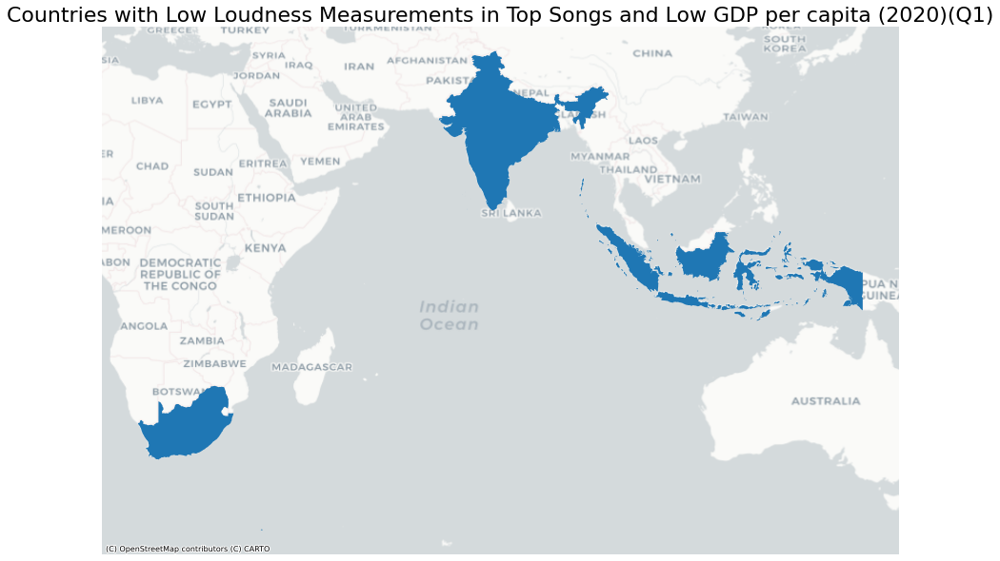

In [134]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['loudness_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Loudness Measurements in Top Songs and Low GDP per capita (2020)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

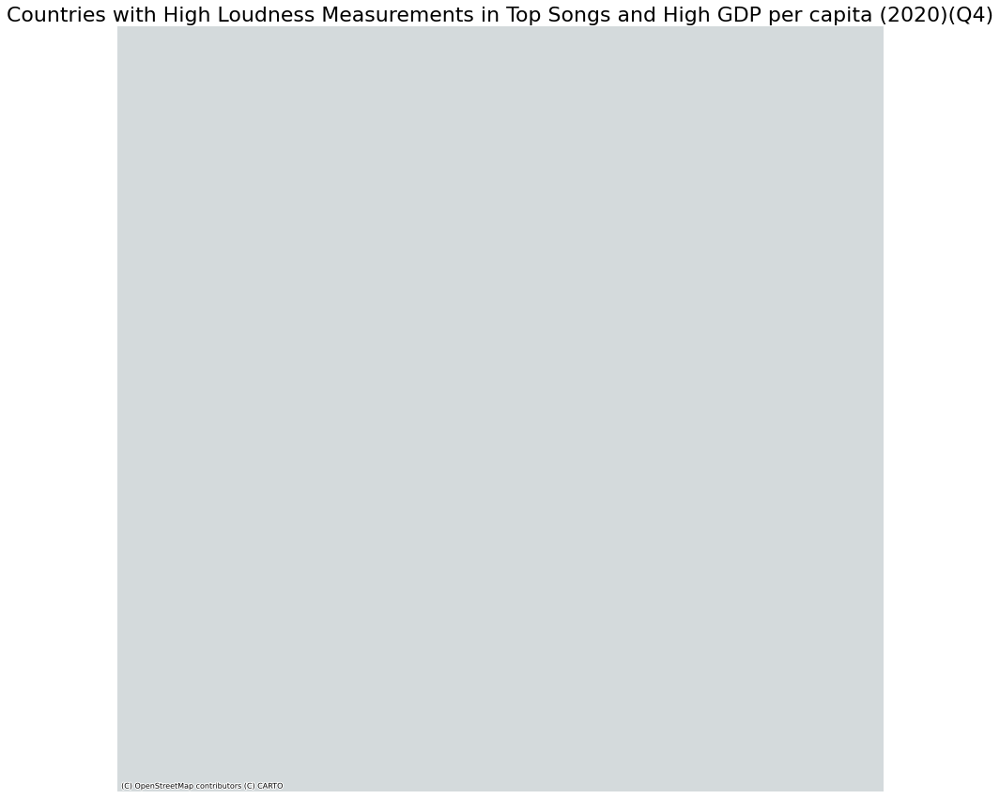

In [136]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['loudness_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Loudness Measurements in Top Songs and High GDP per capita (2020)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

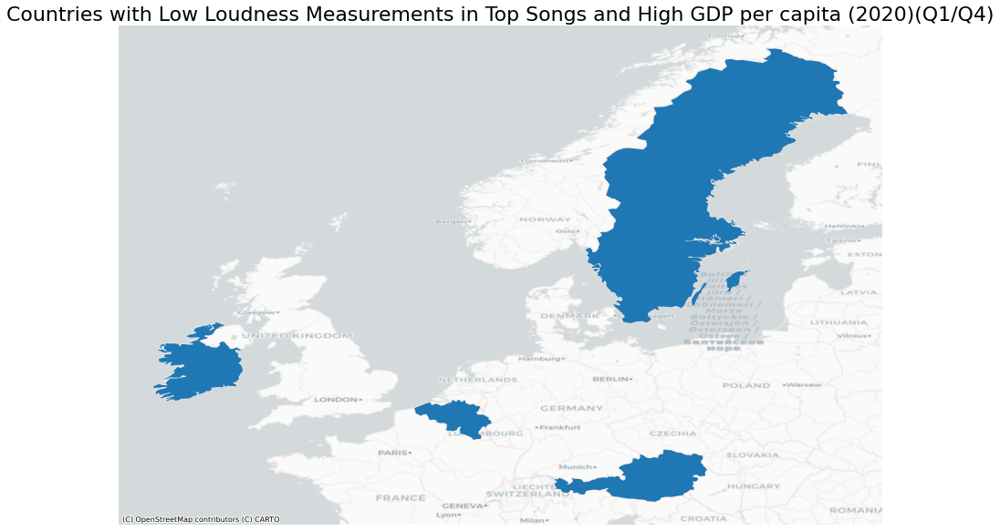

In [137]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['loudness_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Loudness Measurements in Top Songs and High GDP per capita (2020)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

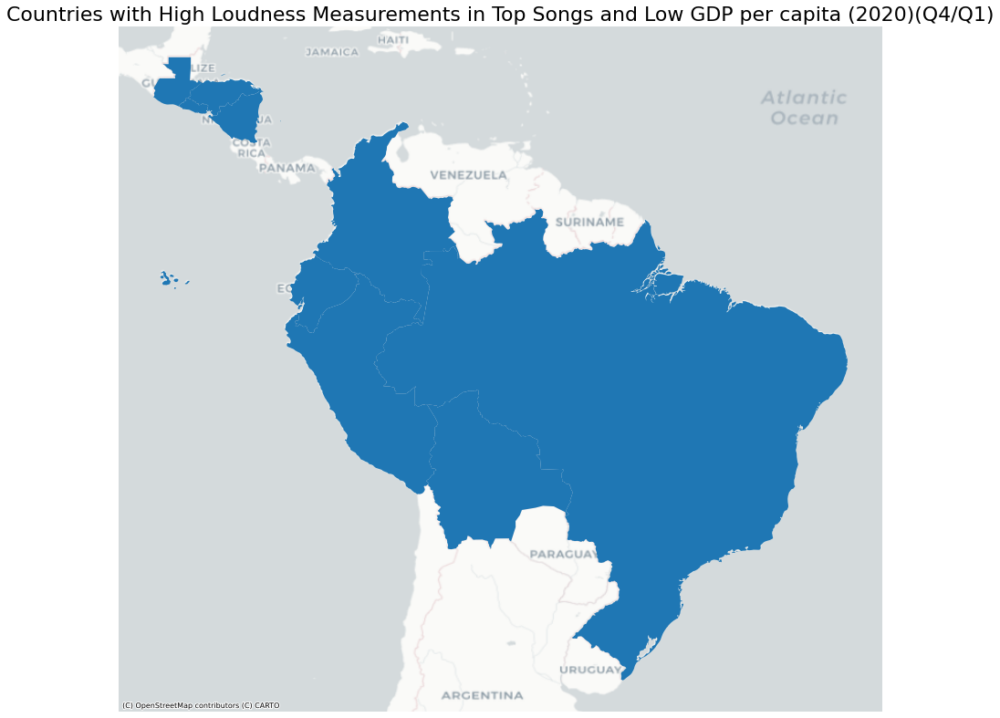

In [138]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['loudness_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Loudness Measurements in Top Songs and Low GDP per capita (2020)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### speechiness

In [65]:
mdf['speechiness_quartile'] = pd.qcut(mdf['speechiness'],4,labels=['Q1','Q2','Q3','Q4'])

In [66]:
mdf[(mdf['speechiness_quartile']=='Q1')]

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,geometry,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,energy_quartile,danceability_quartile,loudness_quartile,speechiness_quartile
4,Bolivia,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,...,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5...",218,BOL,3566.42,3321.92,Q1,Q4,Q2,Q4,Q1
8,Chile,0.669727,0.729364,4.090909,-5.229182,0.636364,0.083518,0.223510,0.000065,0.117109,...,"MULTIPOLYGON (((-73.04210 -43.73384, -73.04640...",228,CHL,14772.11,12612.32,Q2,Q4,Q1,Q4,Q1
9,Colombia,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,"MULTIPOLYGON (((-74.86081 11.12549, -74.83459 ...",233,COL,6423.18,5207.24,Q1,Q4,Q2,Q4,Q1
14,Ecuador,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,...,"MULTIPOLYGON (((-79.45167 -4.76639, -79.51528 ...",248,ECU,6221.67,5315.52,Q1,Q4,Q2,Q4,Q1
15,El Salvador,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,"POLYGON ((-87.69467 13.81901, -87.72501 13.733...",253,SLV,4186.96,3821.29,Q1,Q4,Q1,Q4,Q1
21,Guatemala,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,"POLYGON ((-89.34831 14.43198, -89.43556 14.414...",258,GTM,4354.34,4239.67,Q1,Q4,Q1,Q4,Q1
34,Malaysia,0.648226,0.617581,5.193548,-6.502742,0.580645,0.078142,0.237496,0.049506,0.161577,...,"MULTIPOLYGON (((114.09508 4.59054, 114.15332 4...",548,MYS,11193.02,10192.46,Q2,Q1,Q1,Q3,Q1
36,Mexico,0.709357,0.719857,5.428571,-4.926571,0.642857,0.086957,0.211557,0.000951,0.174114,...,"MULTIPOLYGON (((-111.56001 24.42945, -111.5761...",273,MEX,9862.44,8069.10,Q2,Q4,Q3,Q4,Q1
39,Nicaragua,0.669727,0.729364,4.090909,-5.229182,0.636364,0.083518,0.223510,0.000065,0.117109,...,"POLYGON ((-83.13185 14.99298, -83.19667 14.956...",278,NIC,1920.29,1832.50,Q1,Q4,Q1,Q4,Q1
41,Panama,0.635800,0.678700,4.000000,-5.832700,0.800000,0.079030,0.202980,0.094653,0.122580,...,"MULTIPOLYGON (((-80.02649 8.40154, -80.07055 8...",283,PAN,15834.04,14090.50,Q2,Q4,Q1,Q4,Q1


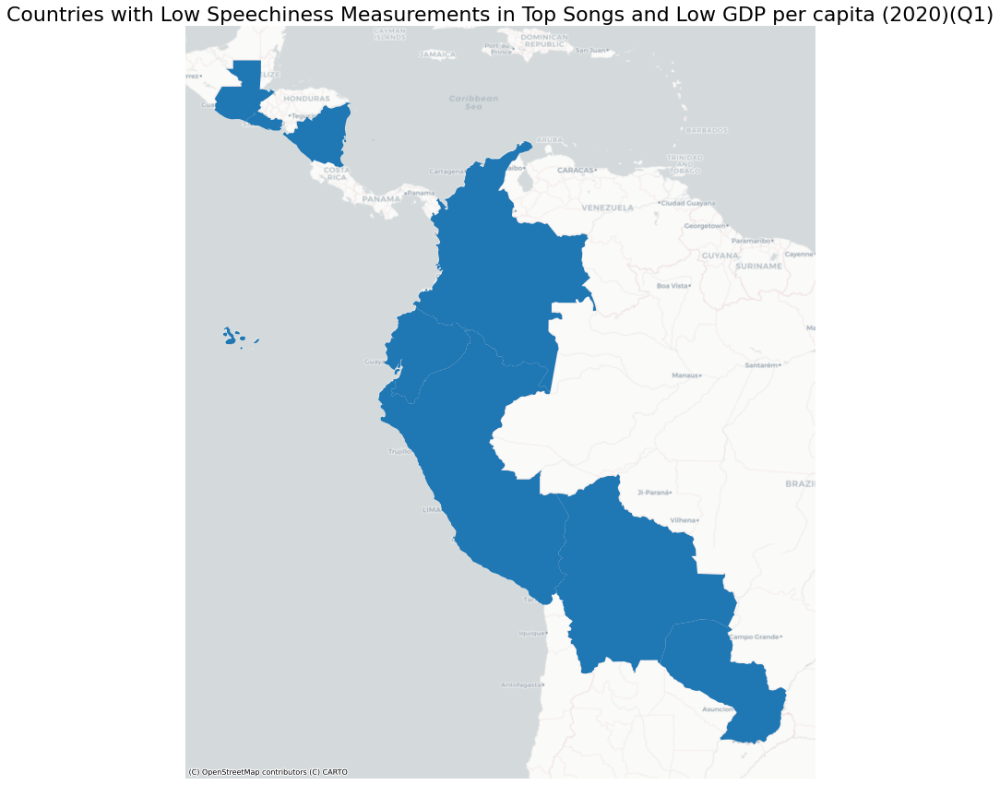

In [139]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['speechiness_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Speechiness Measurements in Top Songs and Low GDP per capita (2020)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

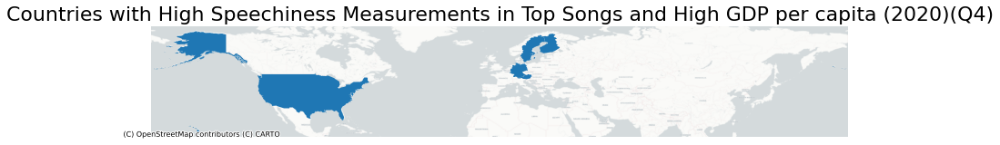

In [140]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['speechiness_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Speechiness Measurements in Top Songs and High GDP per capita (2020)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

/opt/conda/lib/python3.8/site-packages/geopandas/plotting.py:678: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


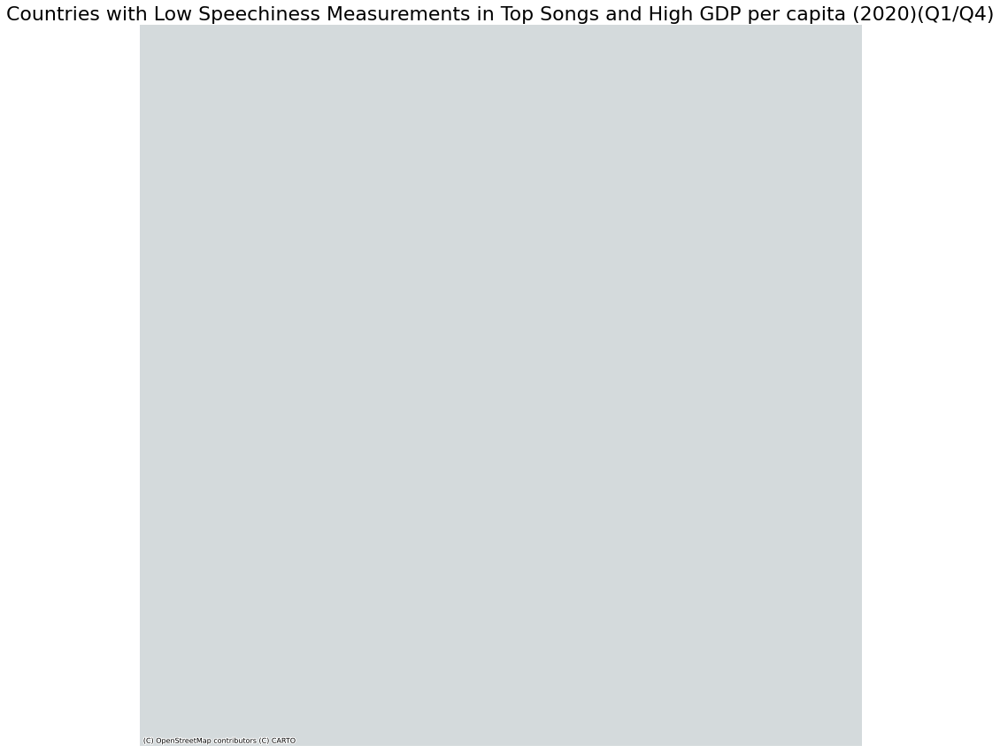

In [141]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['speechiness_quartile']=='Q1') &https://jupyter.idre.ucla.edu/user/claireguo123@gmail.com/notebooks/Week%2010%20Project%20Coding%20-%20Updated.ipynb#
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Speechiness Measurements in Top Songs and High GDP per capita (2020)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

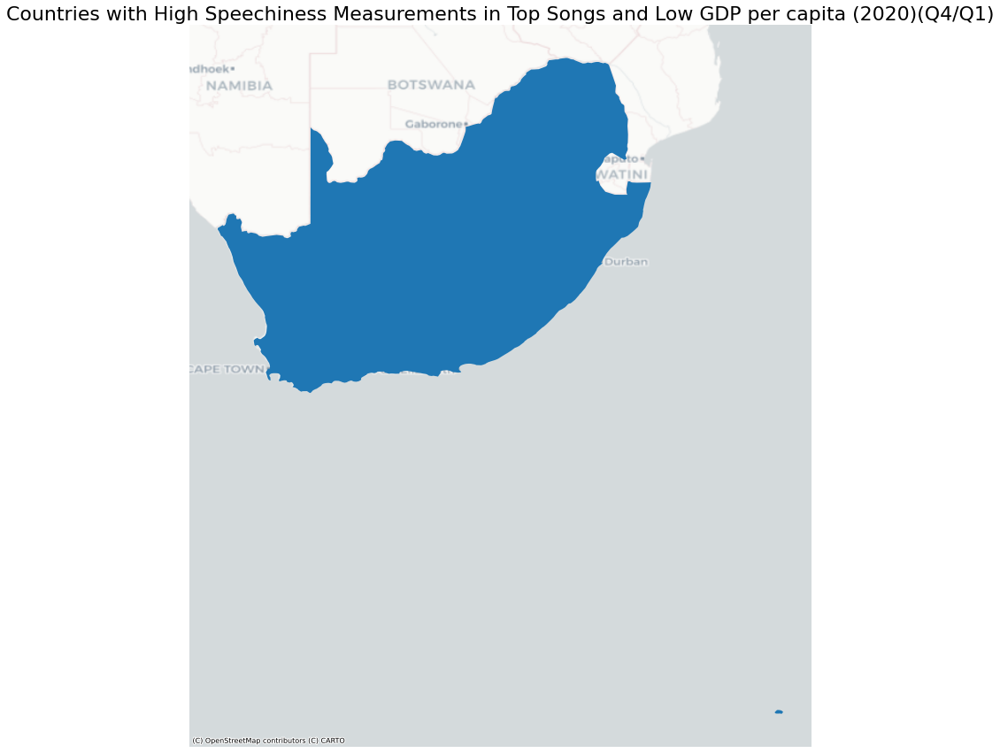

In [142]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['speechiness_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Speechiness Measurements in Top Songs and Low GDP per capita (2020)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### acousticness

In [68]:
mdf['acousticness_quartile'] = pd.qcut(mdf['acousticness'],4,labels=['Q1','Q2','Q3','Q4'])

In [69]:
mdf[(mdf['acousticness_quartile']=='Q1')]

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,WEO Country Code,ISO_y,GDP2019,GDP2020,gdp_quartile,energy_quartile,danceability_quartile,loudness_quartile,speechiness_quartile,acousticness_quartile
0,Argentina,0.693941,0.659353,3.941176,-6.295824,0.647059,0.146606,0.172241,0.000712,0.141424,...,213,ARG,9890.31,8433.04,Q2,Q3,Q2,Q3,Q4,Q1
2,Austria,0.727636,0.626455,6.600000,-6.766836,0.454545,0.127291,0.167883,0.030190,0.215382,...,122,AUT,50380.28,48634.34,Q4,Q2,Q4,Q1,Q4,Q1
5,Brazil,0.721111,0.680556,4.666667,-5.902889,0.444444,0.097900,0.172244,0.001248,0.188911,...,223,BRA,8751.38,6450.45,Q1,Q4,Q4,Q4,Q2,Q1
6,Bulgaria,0.727946,0.625351,6.851351,-6.736257,0.378378,0.137872,0.154195,0.040260,0.229649,...,918,BGR,9772.15,9826.14,Q2,Q2,Q4,Q1,Q4,Q1
10,Costa Rica,0.771591,0.659955,5.227273,-5.574864,0.545455,0.103191,0.175331,0.000032,0.250055,...,238,CRI,12243.84,11629.01,Q2,Q3,Q4,Q4,Q2,Q1
17,Finland,0.737033,0.636500,5.766667,-6.627867,0.533333,0.120707,0.144925,0.000450,0.192003,...,172,FIN,48809.55,48461.48,Q4,Q3,Q4,Q2,Q4,Q1
20,Greece,0.711658,0.629434,6.039474,-6.785395,0.407895,0.128218,0.158030,0.044553,0.208349,...,174,GRC,19569.53,18168.34,Q3,Q2,Q3,Q1,Q4,Q1
24,Iceland,0.724453,0.603679,6.113208,-6.607736,0.509434,0.111991,0.173987,0.031710,0.236802,...,176,ISL,67857.18,57189.03,Q4,Q1,Q4,Q2,Q3,Q1
29,Italy,0.739667,0.689333,5.250000,-5.960208,0.666667,0.160692,0.144703,0.000474,0.186808,...,136,ITA,33159.07,30657.30,Q3,Q4,Q4,Q3,Q4,Q1
30,Japan,0.559818,0.736091,4.181818,-6.520636,0.636364,0.163727,0.104702,0.244818,0.121245,...,158,JPN,40255.94,39047.86,Q3,Q4,Q1,Q3,Q4,Q1


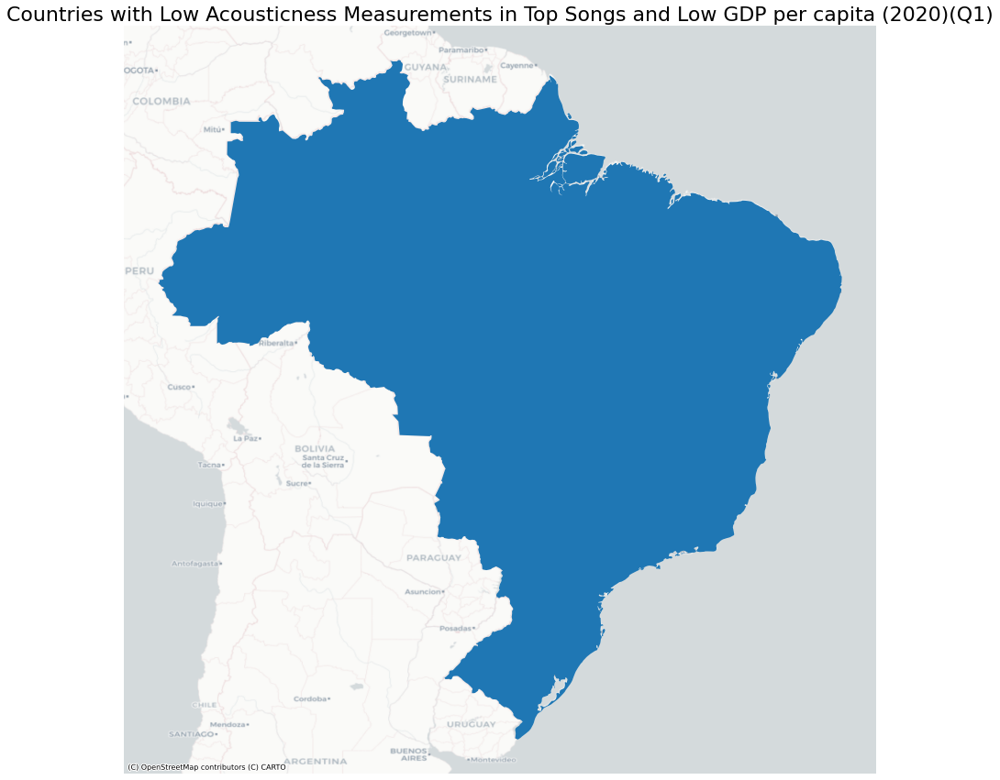

In [143]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['acousticness_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Acousticness Measurements in Top Songs and Low GDP per capita (2020)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

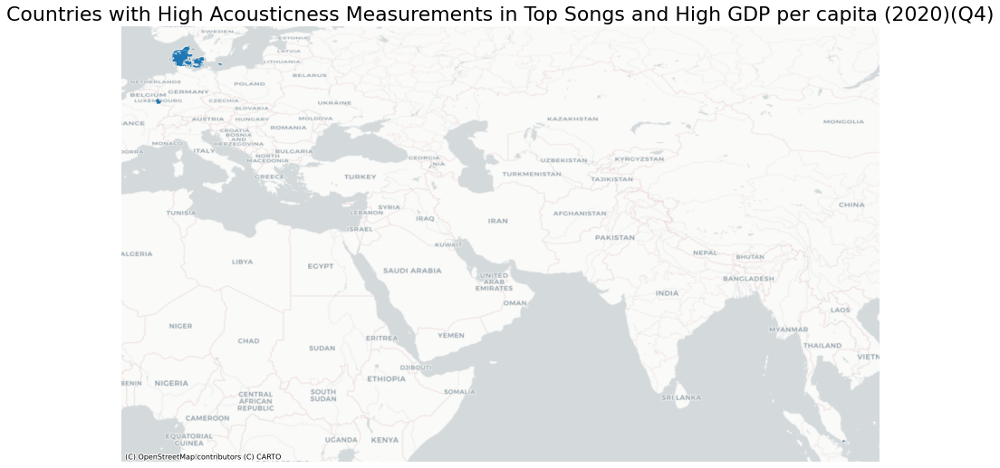

In [144]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['acousticness_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Acousticness Measurements in Top Songs and High GDP per capita (2020)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

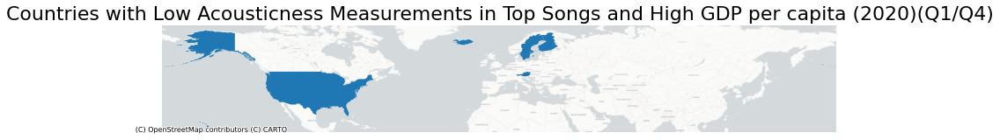

In [145]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['acousticness_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Acousticness Measurements in Top Songs and High GDP per capita (2020)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

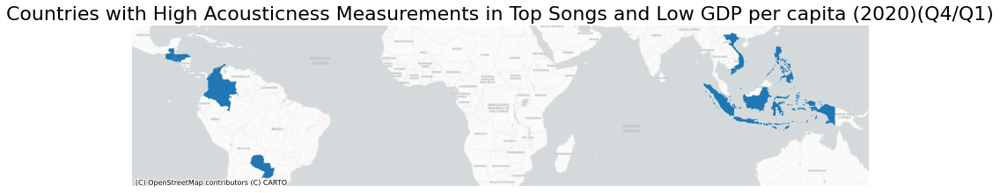

In [146]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['acousticness_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Acousticness Measurements in Top Songs and Low GDP per capita (2020)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### instrumentalness

In [71]:
mdf['instrumentalness_quartile'] = pd.qcut(mdf['instrumentalness'],4,labels=['Q1','Q2','Q3','Q4'])

In [72]:
mdf[(mdf['instrumentalness_quartile']=='Q1')]

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,ISO_y,GDP2019,GDP2020,gdp_quartile,energy_quartile,danceability_quartile,loudness_quartile,speechiness_quartile,acousticness_quartile,instrumentalness_quartile
0,Argentina,0.693941,0.659353,3.941176,-6.295824,0.647059,0.146606,0.172241,0.000712,0.141424,...,ARG,9890.31,8433.04,Q2,Q3,Q2,Q3,Q4,Q1,Q1
4,Bolivia,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,...,BOL,3566.42,3321.92,Q1,Q4,Q2,Q4,Q1,Q3,Q1
8,Chile,0.669727,0.729364,4.090909,-5.229182,0.636364,0.083518,0.223510,0.000065,0.117109,...,CHL,14772.11,12612.32,Q2,Q4,Q1,Q4,Q1,Q3,Q1
9,Colombia,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,COL,6423.18,5207.24,Q1,Q4,Q2,Q4,Q1,Q4,Q1
10,Costa Rica,0.771591,0.659955,5.227273,-5.574864,0.545455,0.103191,0.175331,0.000032,0.250055,...,CRI,12243.84,11629.01,Q2,Q3,Q4,Q4,Q2,Q1,Q1
14,Ecuador,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,...,ECU,6221.67,5315.52,Q1,Q4,Q2,Q4,Q1,Q3,Q1
15,El Salvador,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,SLV,4186.96,3821.29,Q1,Q4,Q1,Q4,Q1,Q4,Q1
17,Finland,0.737033,0.636500,5.766667,-6.627867,0.533333,0.120707,0.144925,0.000450,0.192003,...,FIN,48809.55,48461.48,Q4,Q3,Q4,Q2,Q4,Q1,Q1
19,Germany,0.692348,0.659913,5.695652,-6.527391,0.565217,0.144791,0.189881,0.000585,0.185843,...,DEU,46472.62,45466.12,Q4,Q3,Q2,Q3,Q4,Q2,Q1
21,Guatemala,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,GTM,4354.34,4239.67,Q1,Q4,Q1,Q4,Q1,Q4,Q1


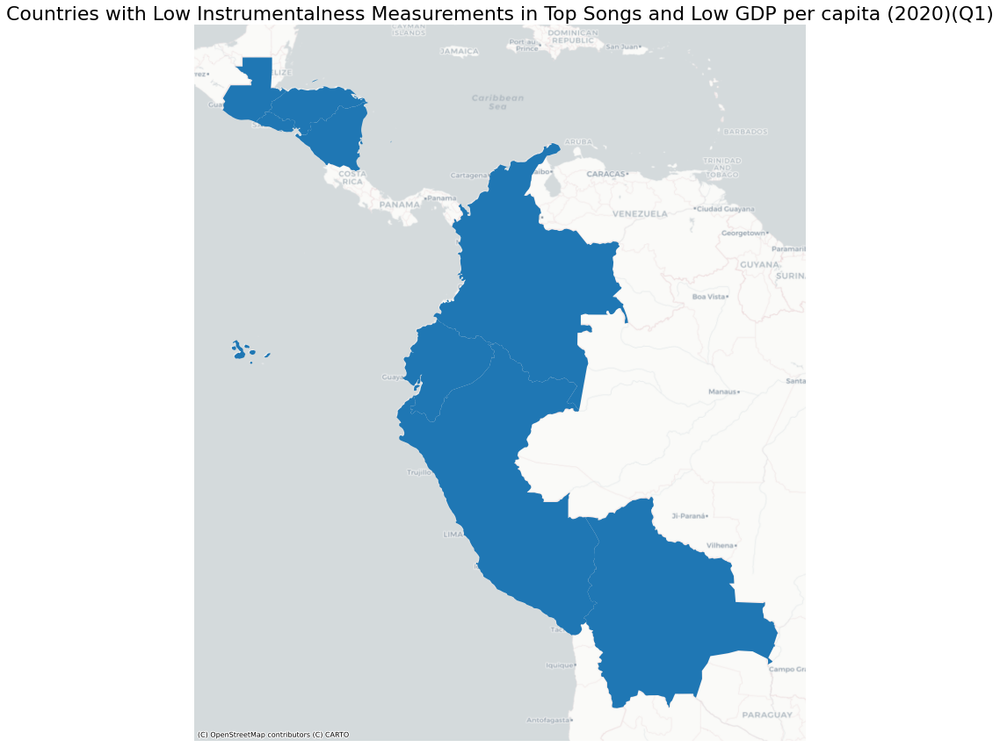

In [147]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['instrumentalness_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Instrumentalness Measurements in Top Songs and Low GDP per capita (2020)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

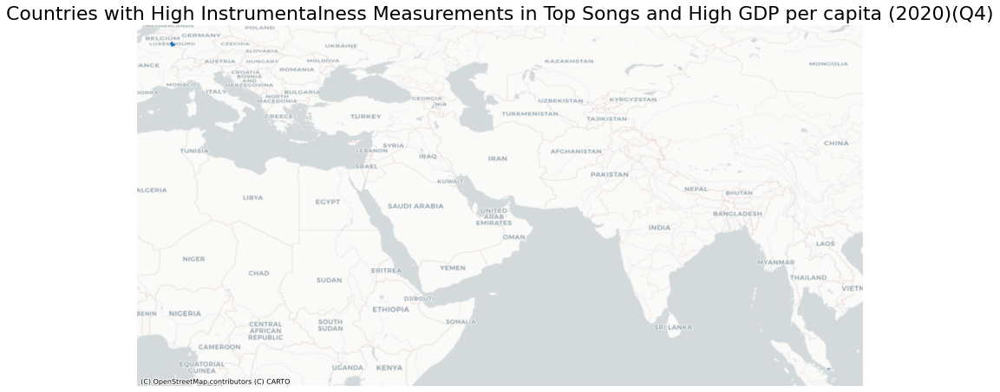

In [148]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['instrumentalness_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Instrumentalness Measurements in Top Songs and High GDP per capita (2020)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

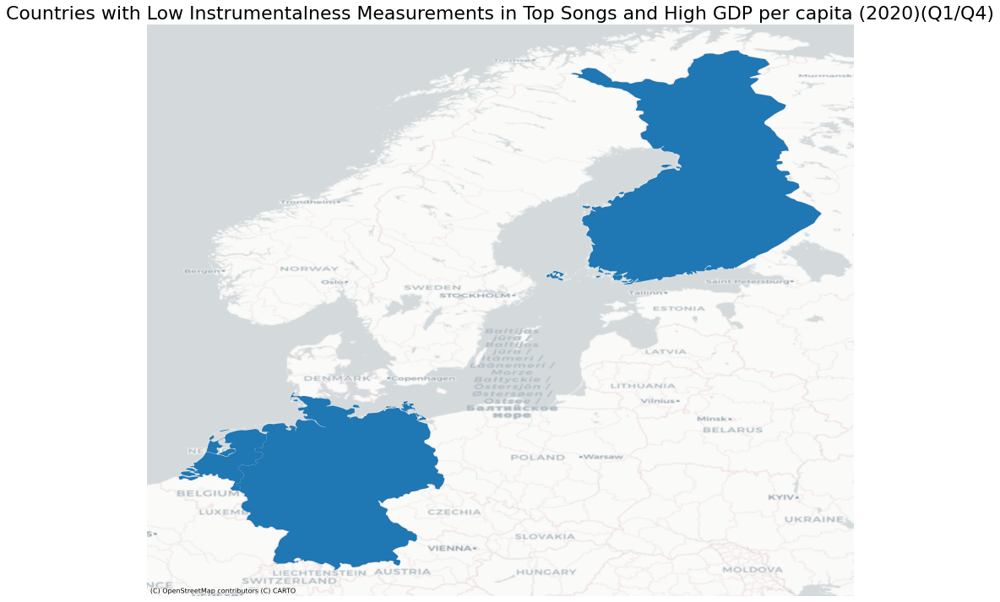

In [149]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['instrumentalness_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Instrumentalness Measurements in Top Songs and High GDP per capita (2020)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

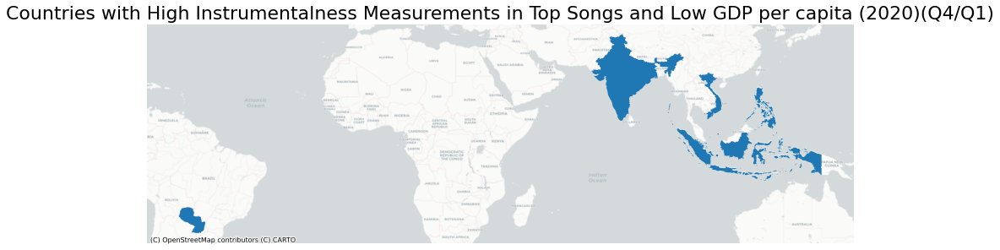

In [150]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['instrumentalness_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Instrumentalness Measurements in Top Songs and Low GDP per capita (2020)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### liveness

In [74]:
mdf['liveness_quartile'] = pd.qcut(mdf['liveness'],4,labels=['Q1','Q2','Q3','Q4'])

In [75]:
mdf[(mdf['liveness_quartile']=='Q1')]

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,GDP2019,GDP2020,gdp_quartile,energy_quartile,danceability_quartile,loudness_quartile,speechiness_quartile,acousticness_quartile,instrumentalness_quartile,liveness_quartile
0,Argentina,0.693941,0.659353,3.941176,-6.295824,0.647059,0.146606,0.172241,0.000712,0.141424,...,9890.31,8433.04,Q2,Q3,Q2,Q3,Q4,Q1,Q1,Q1
4,Bolivia,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,...,3566.42,3321.92,Q1,Q4,Q2,Q4,Q1,Q3,Q1,Q1
8,Chile,0.669727,0.729364,4.090909,-5.229182,0.636364,0.083518,0.223510,0.000065,0.117109,...,14772.11,12612.32,Q2,Q4,Q1,Q4,Q1,Q3,Q1,Q1
9,Colombia,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,6423.18,5207.24,Q1,Q4,Q2,Q4,Q1,Q4,Q1,Q1
13,Dominican Republic,0.652833,0.659250,2.500000,-6.227083,0.666667,0.099283,0.244176,0.078880,0.110900,...,8595.61,7444.80,Q2,Q3,Q1,Q3,Q2,Q4,Q4,Q1
14,Ecuador,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,...,6221.67,5315.52,Q1,Q4,Q2,Q4,Q1,Q3,Q1,Q1
15,El Salvador,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,4186.96,3821.29,Q1,Q4,Q1,Q4,Q1,Q4,Q1,Q1
21,Guatemala,0.678556,0.727444,3.888889,-4.802333,0.777778,0.086556,0.238722,0.000077,0.125467,...,4354.34,4239.67,Q1,Q4,Q1,Q4,Q1,Q4,Q1,Q1
22,Honduras,0.706818,0.677727,3.363636,-5.701909,0.636364,0.107364,0.253682,0.000064,0.123382,...,2550.67,2412.44,Q1,Q3,Q3,Q4,Q2,Q4,Q1,Q1
30,Japan,0.559818,0.736091,4.181818,-6.520636,0.636364,0.163727,0.104702,0.244818,0.121245,...,40255.94,39047.86,Q3,Q4,Q1,Q3,Q4,Q1,Q4,Q1


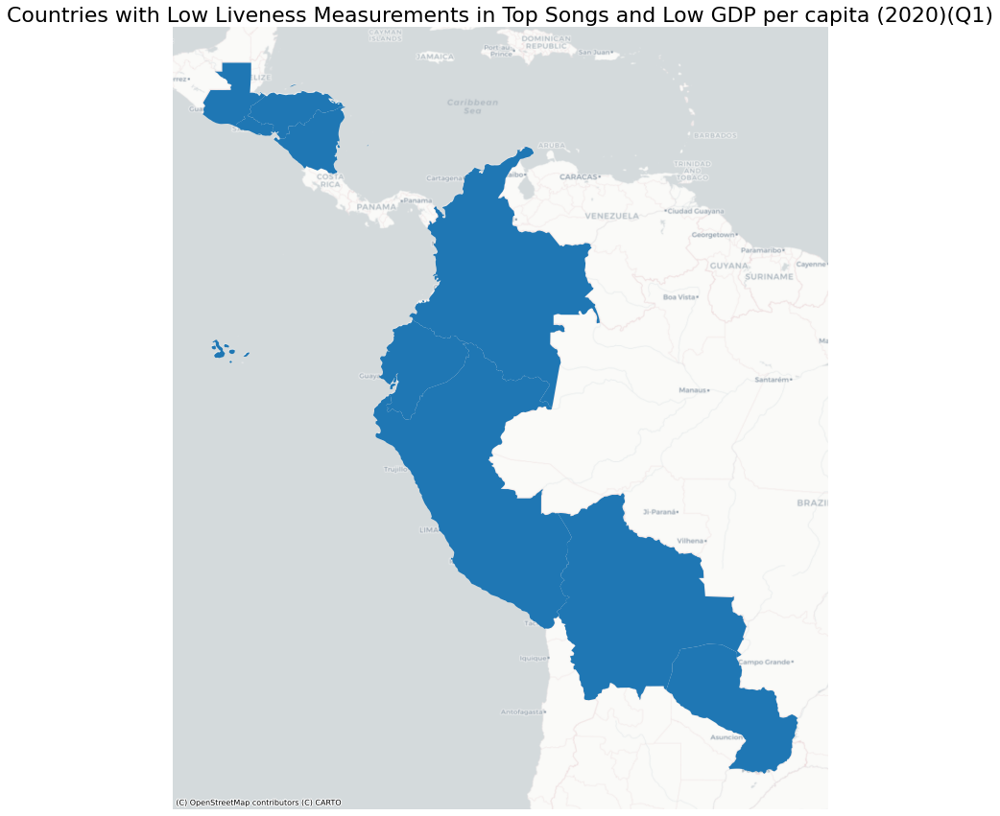

In [151]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['liveness_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Liveness Measurements in Top Songs and Low GDP per capita (2020)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

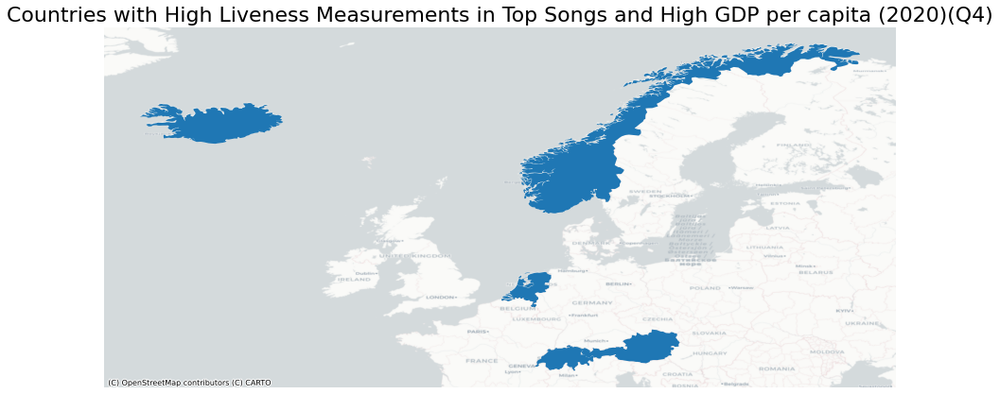

In [152]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['liveness_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Liveness Measurements in Top Songs and High GDP per capita (2020)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

/opt/conda/lib/python3.8/site-packages/geopandas/plotting.py:678: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(


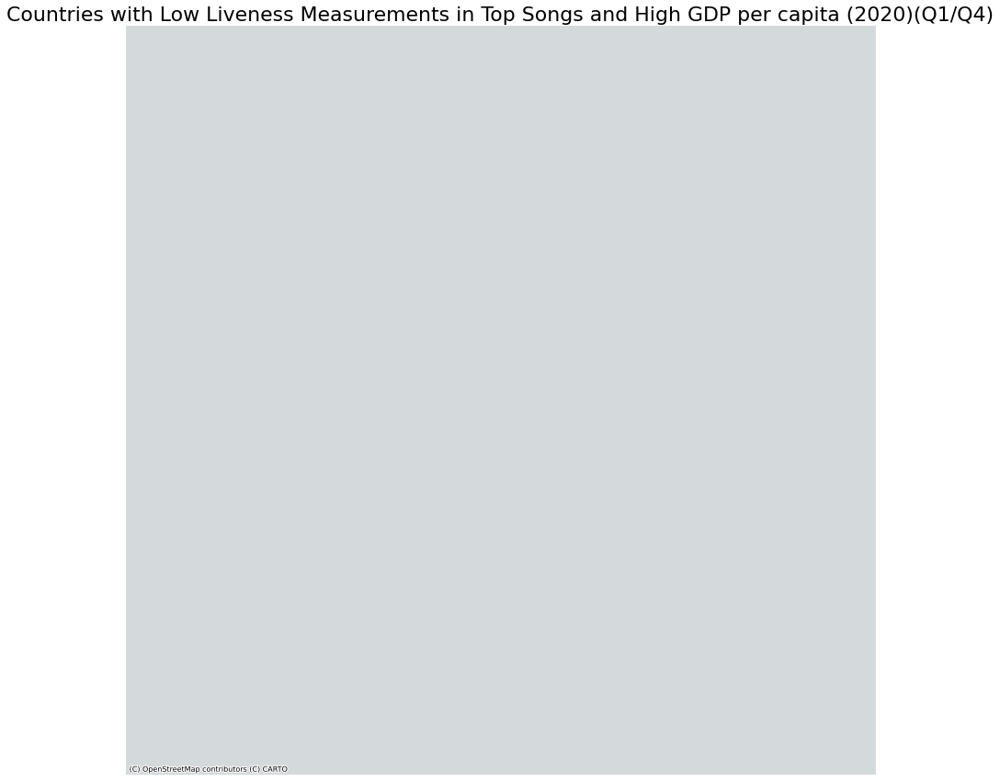

In [153]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['liveness_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Liveness Measurements in Top Songs and High GDP per capita (2020)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

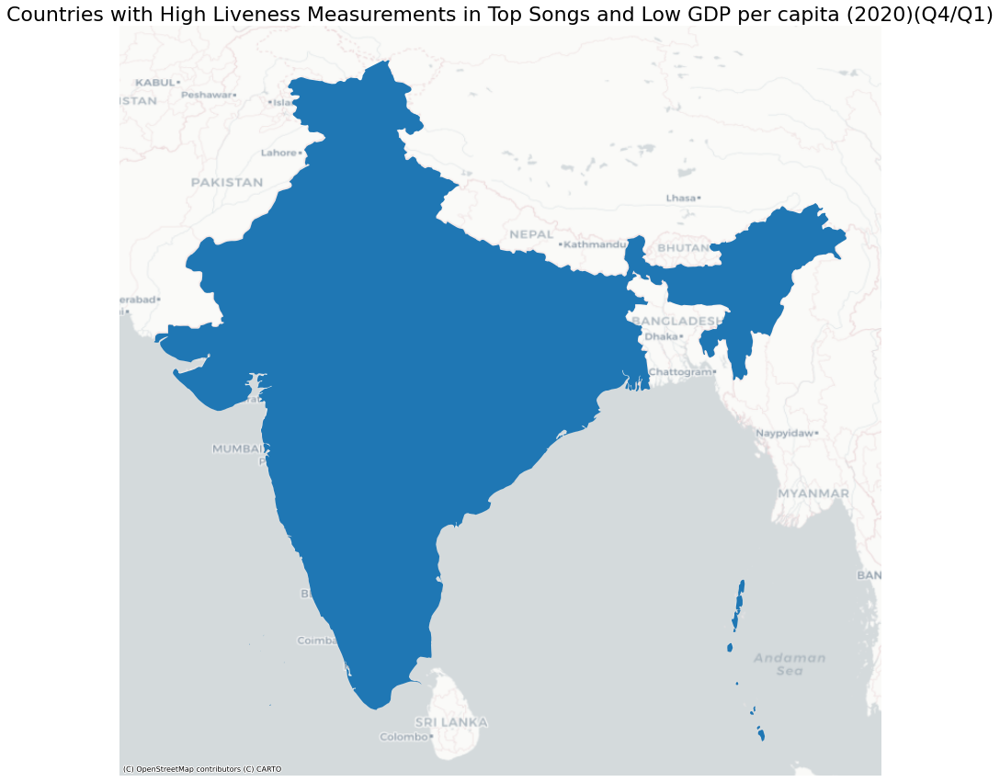

In [154]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['liveness_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Liveness Measurements in Top Songs and Low GDP per capita (2020)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

### valence

In [77]:
mdf['valence_quartile'] = pd.qcut(mdf['valence'],4,labels=['Q1','Q2','Q3','Q4'])

In [78]:
mdf[(mdf['valence_quartile']=='Q1')]

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,GDP2020,gdp_quartile,energy_quartile,danceability_quartile,loudness_quartile,speechiness_quartile,acousticness_quartile,instrumentalness_quartile,liveness_quartile,valence_quartile
7,Canada,0.721515,0.612371,5.536082,-6.680742,0.567010,0.116015,0.205720,0.036540,0.188881,...,42080.05,Q3,Q1,Q4,Q2,Q3,Q3,Q3,Q2,Q1
20,Greece,0.711658,0.629434,6.039474,-6.785395,0.407895,0.128218,0.158030,0.044553,0.208349,...,18168.34,Q3,Q2,Q3,Q1,Q4,Q1,Q3,Q3,Q1
26,Indonesia,0.669114,0.592914,5.342857,-7.181286,0.514286,0.095860,0.265625,0.082265,0.165609,...,4038.40,Q1,Q1,Q1,Q1,Q2,Q4,Q4,Q2,Q1
30,Japan,0.559818,0.736091,4.181818,-6.520636,0.636364,0.163727,0.104702,0.244818,0.121245,...,39047.86,Q3,Q4,Q1,Q3,Q4,Q1,Q4,Q1,Q1
33,Luxembourg,0.685800,0.607720,5.940000,-6.643740,0.460000,0.117764,0.244436,0.073173,0.198714,...,109602.32,Q4,Q1,Q2,Q2,Q4,Q4,Q4,Q3,Q1
34,Malaysia,0.648226,0.617581,5.193548,-6.502742,0.580645,0.078142,0.237496,0.049506,0.161577,...,10192.46,Q2,Q1,Q1,Q3,Q1,Q4,Q3,Q2,Q1
35,Malta,0.637947,0.656368,5.631579,-6.613105,0.368421,0.092368,0.181090,0.080117,0.159837,...,28468.65,Q3,Q3,Q1,Q2,Q2,Q2,Q4,Q2,Q1
41,Panama,0.635800,0.678700,4.000000,-5.832700,0.800000,0.079030,0.202980,0.094653,0.122580,...,14090.50,Q2,Q4,Q1,Q4,Q1,Q3,Q4,Q1,Q1
42,Paraguay,0.642636,0.666364,2.636364,-5.904727,0.818182,0.079736,0.231646,0.087050,0.110073,...,4909.39,Q1,Q3,Q1,Q3,Q1,Q4,Q4,Q1,Q1
44,Philippines,0.664400,0.613775,5.400000,-6.649350,0.525000,0.096340,0.255381,0.071554,0.160855,...,3372.53,Q1,Q1,Q1,Q2,Q2,Q4,Q4,Q2,Q1


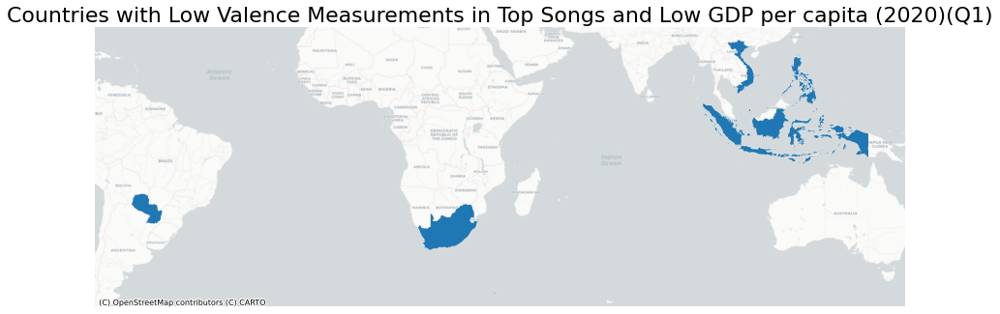

In [155]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['valence_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Valence Measurements in Top Songs and Low GDP per capita (2020)(Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

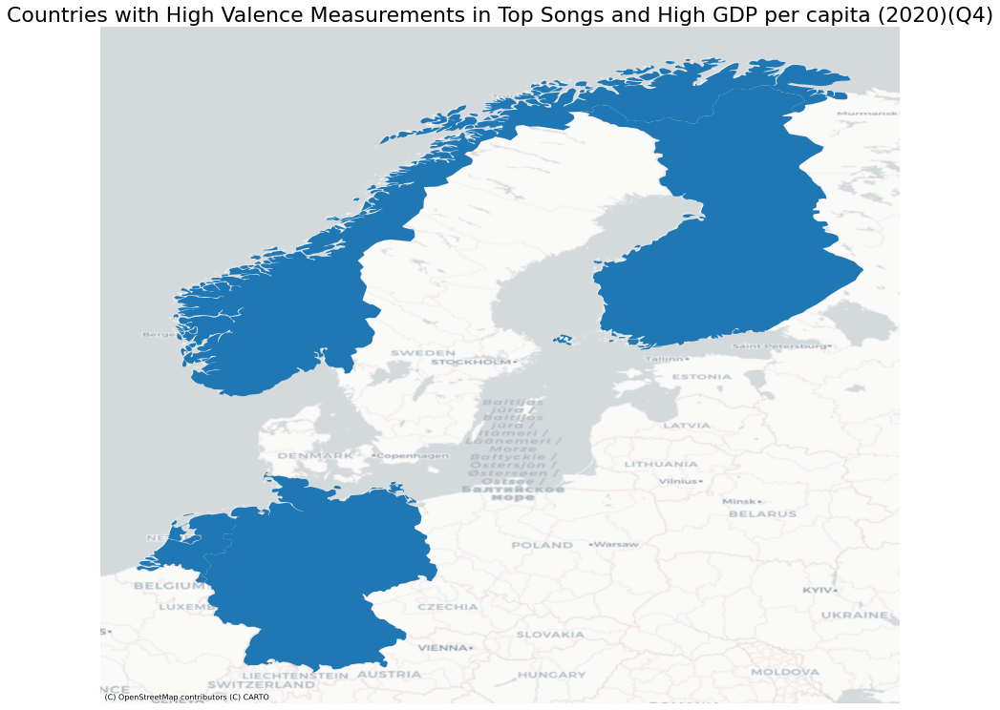

In [156]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['valence_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Valence Measurements in Top Songs and High GDP per capita (2020)(Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

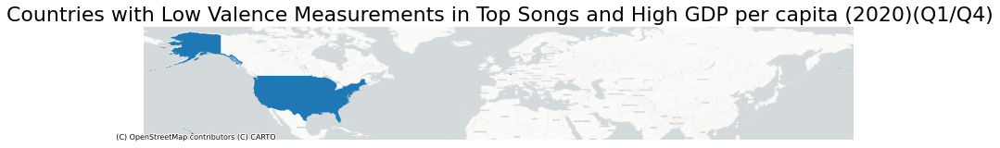

In [157]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['valence_quartile']=='Q1') &
   (mdf['gdp_quartile']=='Q4')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with Low Valence Measurements in Top Songs and High GDP per capita (2020)(Q1/Q4)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')

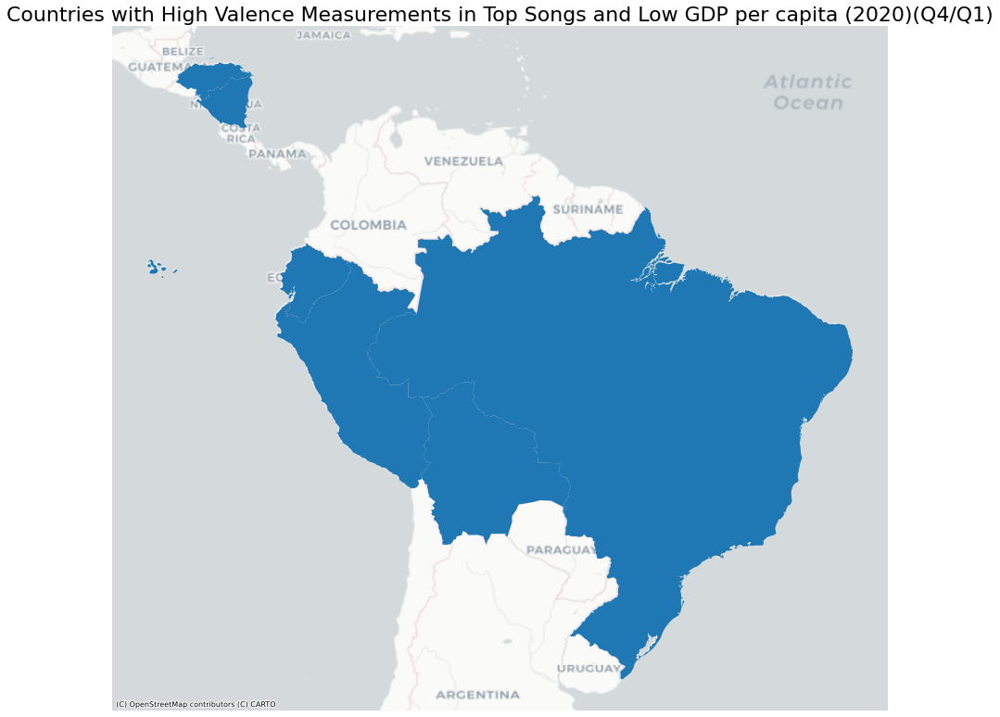

In [158]:
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
mdf[(mdf['valence_quartile']=='Q4') &
   (mdf['gdp_quartile']=='Q1')].plot(ax=ax)

ax.axis('off')
ax.set_title('Countries with High Valence Measurements in Top Songs and Low GDP per capita (2020)(Q4/Q1)',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:4326')